# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

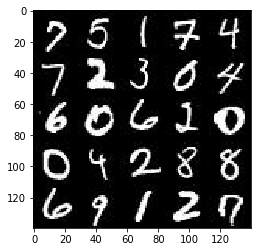

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

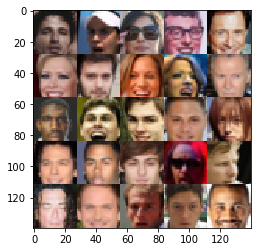

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_inputs = tf.placeholder(
        dtype=tf.float32, 
        shape=(None, image_width, image_height, image_channels),
        name='real_inputs')
    z_inputs = tf.placeholder(
        dtype=tf.float32, 
        shape=(None, z_dim),
        name='z_inputs')
    learning_rate = tf.placeholder(
        dtype=tf.float32,
        shape=None,
        name='learning_rate')
    
    return real_inputs, z_inputs, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.1
    
    with tf.variable_scope('discriminator', reuse=reuse):  
        d1 = tf.layers.conv2d(inputs=images, filters=64, kernel_size=5, strides=2, padding='same')
        d1 = tf.maximum(x=alpha * d1, y=d1)
        
        d2 = tf.layers.conv2d(inputs=d1, filters=128, kernel_size=5, strides=2, padding='same')
        d2 = tf.layers.batch_normalization(inputs=d2, training=True)
        d2 = tf.maximum(x=alpha*d2, y=d2)
        
        d3 = tf.layers.conv2d(inputs=d2, filters=256, kernel_size=5, strides=2, padding='same')
        d3 = tf.layers.batch_normalization(inputs=d3, training=True)
        d3 = tf.maximum(x=alpha*d3, y=d3)
        
        flat = tf.reshape(tensor=d3, shape=(-1, 4*4*256))
        logits= tf.layers.dense(inputs=flat, units=1)
        out = tf.sigmoid(x=logits)

    return out, logits

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.1
    
    with tf.variable_scope('generator', reuse=not is_train):
        
        g1 = tf.layers.dense(inputs=z, units=7*7*256)
        g1 = tf.reshape(tensor=g1, shape=(-1, 7, 7, 256))
        g1 = tf.layers.batch_normalization(inputs=g1, training=is_train)
        g1 = tf.maximum(x=alpha * g1, y=g1)
        
        g2 = tf.layers.conv2d_transpose(inputs=g1, filters=128, kernel_size=5, strides=2, padding='same')
        g2 = tf.layers.batch_normalization(inputs=g2, training=is_train)
        g2 = tf.maximum(x=alpha * g2, y=g2)
        
        g3 = tf.layers.conv2d_transpose(inputs=g2, filters=64, kernel_size=5, strides=2, padding='same')
        g3 = tf.layers.batch_normalization(inputs=g3, training=is_train)
        g3 = tf.maximum(x=alpha * g3, y=g3)
        
        logits = tf.layers.conv2d_transpose(inputs=g3, filters=out_channel_dim, kernel_size=3, strides=1, padding='same')
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    g_out = generator(input_z, out_channel_dim)
    d_out_real, d_logits_real = discriminator(images=input_real)
    d_out_fake, d_logits_fake = discriminator(images=g_out, reuse=True)
    
    d_loss_real = tf.reduce_mean(
        input_tensor=tf.nn.sigmoid_cross_entropy_with_logits(
            labels=tf.ones_like(tensor=d_out_real),
            logits=d_logits_real))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            labels=tf.zeros_like(tensor=d_out_fake),
            logits=d_logits_fake))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            labels=tf.ones_like(tensor=d_out_fake),
            logits=d_logits_fake))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    update_ops = tf.get_collection(key=tf.GraphKeys.UPDATE_OPS)
    
    with tf.control_dependencies(update_ops):
        g_opt = tf.train.AdamOptimizer(
            learning_rate=learning_rate,
            beta1=beta1).minimize(g_loss, var_list=g_vars)
    
        d_opt = tf.train.AdamOptimizer(
            learning_rate=learning_rate,
            beta1=beta1).minimize(d_loss, var_list=d_vars)
        
    return d_opt, g_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:
import time

def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model    
    _, image_width, image_height, image_channels = data_shape
    real_inputs, z_inputs, _ = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(real_inputs, z_inputs, image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)

    saver = tf.train.Saver()
    steps = 0
    print_every = 10
    show_every = 50
    losses = []
    n_images = 25

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images *= 2
                
                z_batch = np.random.uniform(low=-1, high=1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={real_inputs: batch_images, z_inputs: z_batch})
                _ = sess.run(g_opt, feed_dict={real_inputs: batch_images, z_inputs: z_batch})
                
                if steps % print_every == 0:
                    d_train_loss = d_loss.eval({z_inputs: z_batch, real_inputs: batch_images})
                    g_train_loss = g_loss.eval({z_inputs: z_batch})
                    
                    print(time.strftime("%m/%d/%y %H:%M:%S "),
                          "Epoch: {}/{} ".format(epoch_i + 1, epochs),
                          "Step: {} ".format(steps),
                          "Generator Loss: {:.2f} ".format(g_train_loss),
                          "Discriminator Loss: {:.2f} ".format(d_train_loss))
                    
                    losses.append((d_train_loss, g_train_loss))
                
                if steps % show_every == 0:
                    show_generator_output(sess, n_images, z_inputs, image_channels, 
                                          data_image_mode)


        saver.save(sess, './generator.ckpt')

    return losses 

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

07/23/17 17:35:21  Epoch: 1/2  Step: 10  Generator Loss: 2.06  Discriminator Loss: 0.21 
07/23/17 17:35:22  Epoch: 1/2  Step: 20  Generator Loss: 3.37  Discriminator Loss: 0.05 
07/23/17 17:35:22  Epoch: 1/2  Step: 30  Generator Loss: 0.47  Discriminator Loss: 1.39 
07/23/17 17:35:23  Epoch: 1/2  Step: 40  Generator Loss: 2.44  Discriminator Loss: 0.66 
07/23/17 17:35:24  Epoch: 1/2  Step: 50  Generator Loss: 2.35  Discriminator Loss: 0.96 


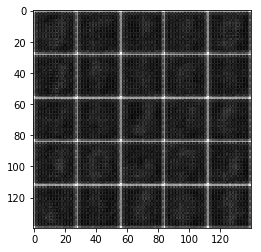

07/23/17 17:35:24  Epoch: 1/2  Step: 60  Generator Loss: 1.54  Discriminator Loss: 1.27 
07/23/17 17:35:25  Epoch: 1/2  Step: 70  Generator Loss: 1.13  Discriminator Loss: 0.87 
07/23/17 17:35:25  Epoch: 1/2  Step: 80  Generator Loss: 0.64  Discriminator Loss: 1.16 
07/23/17 17:35:26  Epoch: 1/2  Step: 90  Generator Loss: 0.70  Discriminator Loss: 1.08 
07/23/17 17:35:26  Epoch: 1/2  Step: 100  Generator Loss: 0.53  Discriminator Loss: 1.31 


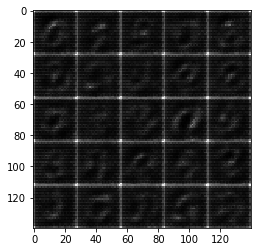

07/23/17 17:35:27  Epoch: 1/2  Step: 110  Generator Loss: 1.11  Discriminator Loss: 1.00 
07/23/17 17:35:28  Epoch: 1/2  Step: 120  Generator Loss: 1.67  Discriminator Loss: 1.34 
07/23/17 17:35:28  Epoch: 1/2  Step: 130  Generator Loss: 1.03  Discriminator Loss: 1.00 
07/23/17 17:35:29  Epoch: 1/2  Step: 140  Generator Loss: 0.28  Discriminator Loss: 1.66 
07/23/17 17:35:29  Epoch: 1/2  Step: 150  Generator Loss: 1.28  Discriminator Loss: 0.96 


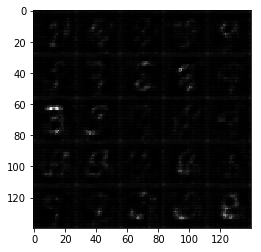

07/23/17 17:35:30  Epoch: 1/2  Step: 160  Generator Loss: 1.33  Discriminator Loss: 0.94 
07/23/17 17:35:31  Epoch: 1/2  Step: 170  Generator Loss: 0.67  Discriminator Loss: 1.12 
07/23/17 17:35:31  Epoch: 1/2  Step: 180  Generator Loss: 0.39  Discriminator Loss: 1.34 
07/23/17 17:35:32  Epoch: 1/2  Step: 190  Generator Loss: 1.11  Discriminator Loss: 0.94 
07/23/17 17:35:32  Epoch: 1/2  Step: 200  Generator Loss: 1.27  Discriminator Loss: 0.73 


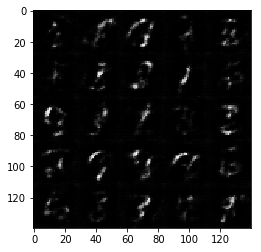

07/23/17 17:35:33  Epoch: 1/2  Step: 210  Generator Loss: 1.33  Discriminator Loss: 0.68 
07/23/17 17:35:34  Epoch: 1/2  Step: 220  Generator Loss: 0.47  Discriminator Loss: 1.24 
07/23/17 17:35:34  Epoch: 1/2  Step: 230  Generator Loss: 1.83  Discriminator Loss: 0.70 
07/23/17 17:35:35  Epoch: 1/2  Step: 240  Generator Loss: 1.01  Discriminator Loss: 0.76 
07/23/17 17:35:35  Epoch: 1/2  Step: 250  Generator Loss: 2.87  Discriminator Loss: 1.35 


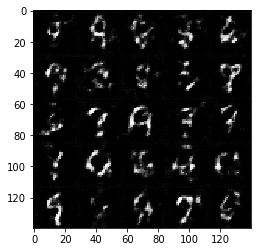

07/23/17 17:35:36  Epoch: 1/2  Step: 260  Generator Loss: 1.53  Discriminator Loss: 0.67 
07/23/17 17:35:37  Epoch: 1/2  Step: 270  Generator Loss: 1.13  Discriminator Loss: 0.78 
07/23/17 17:35:37  Epoch: 1/2  Step: 280  Generator Loss: 1.09  Discriminator Loss: 0.79 
07/23/17 17:35:38  Epoch: 1/2  Step: 290  Generator Loss: 0.54  Discriminator Loss: 1.24 
07/23/17 17:35:38  Epoch: 1/2  Step: 300  Generator Loss: 0.69  Discriminator Loss: 1.05 


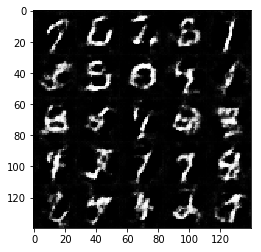

07/23/17 17:35:39  Epoch: 1/2  Step: 310  Generator Loss: 0.62  Discriminator Loss: 1.06 
07/23/17 17:35:40  Epoch: 1/2  Step: 320  Generator Loss: 1.42  Discriminator Loss: 0.85 
07/23/17 17:35:40  Epoch: 1/2  Step: 330  Generator Loss: 0.97  Discriminator Loss: 0.96 
07/23/17 17:35:41  Epoch: 1/2  Step: 340  Generator Loss: 0.44  Discriminator Loss: 1.31 
07/23/17 17:35:41  Epoch: 1/2  Step: 350  Generator Loss: 0.60  Discriminator Loss: 1.10 


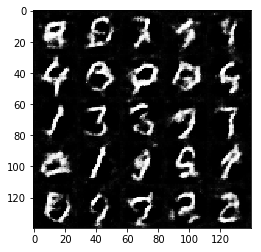

07/23/17 17:35:42  Epoch: 1/2  Step: 360  Generator Loss: 1.91  Discriminator Loss: 0.90 
07/23/17 17:35:43  Epoch: 1/2  Step: 370  Generator Loss: 0.65  Discriminator Loss: 1.07 
07/23/17 17:35:43  Epoch: 1/2  Step: 380  Generator Loss: 0.69  Discriminator Loss: 1.03 
07/23/17 17:35:44  Epoch: 1/2  Step: 390  Generator Loss: 0.63  Discriminator Loss: 1.04 
07/23/17 17:35:44  Epoch: 1/2  Step: 400  Generator Loss: 0.61  Discriminator Loss: 1.12 


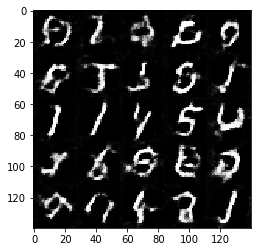

07/23/17 17:35:45  Epoch: 1/2  Step: 410  Generator Loss: 1.62  Discriminator Loss: 0.86 
07/23/17 17:35:45  Epoch: 1/2  Step: 420  Generator Loss: 1.23  Discriminator Loss: 0.80 
07/23/17 17:35:46  Epoch: 1/2  Step: 430  Generator Loss: 1.15  Discriminator Loss: 0.91 
07/23/17 17:35:47  Epoch: 1/2  Step: 440  Generator Loss: 0.67  Discriminator Loss: 1.07 
07/23/17 17:35:47  Epoch: 1/2  Step: 450  Generator Loss: 1.06  Discriminator Loss: 0.76 


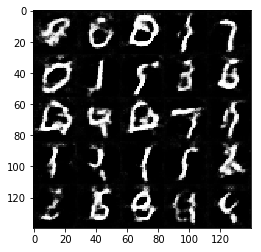

07/23/17 17:35:48  Epoch: 1/2  Step: 460  Generator Loss: 1.53  Discriminator Loss: 1.13 
07/23/17 17:35:48  Epoch: 1/2  Step: 470  Generator Loss: 0.90  Discriminator Loss: 0.96 
07/23/17 17:35:49  Epoch: 1/2  Step: 480  Generator Loss: 1.01  Discriminator Loss: 0.87 
07/23/17 17:35:49  Epoch: 1/2  Step: 490  Generator Loss: 0.69  Discriminator Loss: 1.01 
07/23/17 17:35:50  Epoch: 1/2  Step: 500  Generator Loss: 0.84  Discriminator Loss: 0.93 


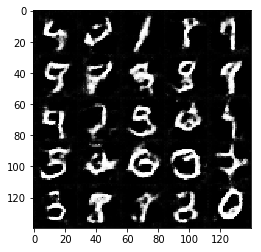

07/23/17 17:35:51  Epoch: 1/2  Step: 510  Generator Loss: 0.77  Discriminator Loss: 0.95 
07/23/17 17:35:51  Epoch: 1/2  Step: 520  Generator Loss: 1.48  Discriminator Loss: 0.87 
07/23/17 17:35:52  Epoch: 1/2  Step: 530  Generator Loss: 1.02  Discriminator Loss: 0.93 
07/23/17 17:35:52  Epoch: 1/2  Step: 540  Generator Loss: 1.02  Discriminator Loss: 0.87 
07/23/17 17:35:53  Epoch: 1/2  Step: 550  Generator Loss: 1.02  Discriminator Loss: 0.83 


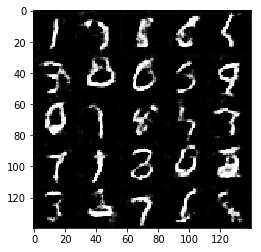

07/23/17 17:35:54  Epoch: 1/2  Step: 560  Generator Loss: 1.21  Discriminator Loss: 0.85 
07/23/17 17:35:54  Epoch: 1/2  Step: 570  Generator Loss: 0.80  Discriminator Loss: 0.92 
07/23/17 17:35:55  Epoch: 1/2  Step: 580  Generator Loss: 0.84  Discriminator Loss: 0.93 
07/23/17 17:35:55  Epoch: 1/2  Step: 590  Generator Loss: 0.62  Discriminator Loss: 1.02 
07/23/17 17:35:56  Epoch: 1/2  Step: 600  Generator Loss: 1.17  Discriminator Loss: 0.91 


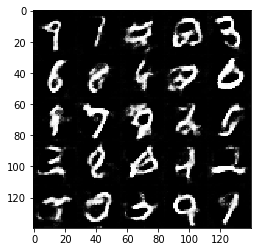

07/23/17 17:35:57  Epoch: 1/2  Step: 610  Generator Loss: 1.23  Discriminator Loss: 0.87 
07/23/17 17:35:57  Epoch: 1/2  Step: 620  Generator Loss: 0.93  Discriminator Loss: 0.84 
07/23/17 17:35:58  Epoch: 1/2  Step: 630  Generator Loss: 1.04  Discriminator Loss: 0.79 
07/23/17 17:35:58  Epoch: 1/2  Step: 640  Generator Loss: 0.85  Discriminator Loss: 0.88 
07/23/17 17:35:59  Epoch: 1/2  Step: 650  Generator Loss: 1.69  Discriminator Loss: 0.73 


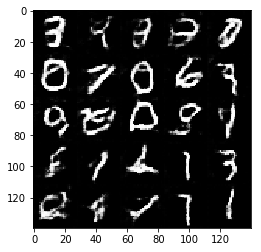

07/23/17 17:36:00  Epoch: 1/2  Step: 660  Generator Loss: 1.56  Discriminator Loss: 0.72 
07/23/17 17:36:00  Epoch: 1/2  Step: 670  Generator Loss: 0.98  Discriminator Loss: 0.77 
07/23/17 17:36:01  Epoch: 1/2  Step: 680  Generator Loss: 3.00  Discriminator Loss: 2.09 
07/23/17 17:36:01  Epoch: 1/2  Step: 690  Generator Loss: 0.92  Discriminator Loss: 0.81 
07/23/17 17:36:02  Epoch: 1/2  Step: 700  Generator Loss: 0.81  Discriminator Loss: 0.90 


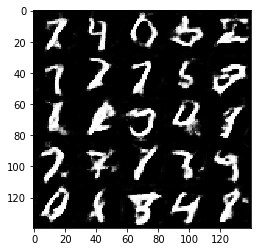

07/23/17 17:36:03  Epoch: 1/2  Step: 710  Generator Loss: 0.82  Discriminator Loss: 0.87 
07/23/17 17:36:03  Epoch: 1/2  Step: 720  Generator Loss: 1.20  Discriminator Loss: 0.73 
07/23/17 17:36:04  Epoch: 1/2  Step: 730  Generator Loss: 0.71  Discriminator Loss: 0.99 
07/23/17 17:36:04  Epoch: 1/2  Step: 740  Generator Loss: 1.28  Discriminator Loss: 0.73 
07/23/17 17:36:05  Epoch: 1/2  Step: 750  Generator Loss: 0.88  Discriminator Loss: 0.81 


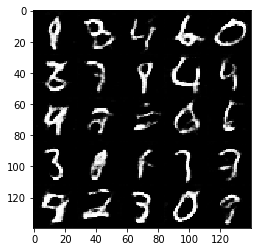

07/23/17 17:36:06  Epoch: 1/2  Step: 760  Generator Loss: 1.22  Discriminator Loss: 0.72 
07/23/17 17:36:06  Epoch: 1/2  Step: 770  Generator Loss: 0.54  Discriminator Loss: 1.21 
07/23/17 17:36:07  Epoch: 1/2  Step: 780  Generator Loss: 0.46  Discriminator Loss: 1.25 
07/23/17 17:36:07  Epoch: 1/2  Step: 790  Generator Loss: 1.03  Discriminator Loss: 0.83 
07/23/17 17:36:08  Epoch: 1/2  Step: 800  Generator Loss: 0.95  Discriminator Loss: 0.87 


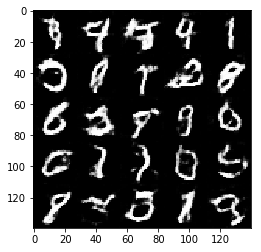

07/23/17 17:36:09  Epoch: 1/2  Step: 810  Generator Loss: 0.67  Discriminator Loss: 0.95 
07/23/17 17:36:09  Epoch: 1/2  Step: 820  Generator Loss: 1.45  Discriminator Loss: 0.70 
07/23/17 17:36:10  Epoch: 1/2  Step: 830  Generator Loss: 0.48  Discriminator Loss: 1.17 
07/23/17 17:36:10  Epoch: 1/2  Step: 840  Generator Loss: 1.85  Discriminator Loss: 1.50 
07/23/17 17:36:11  Epoch: 1/2  Step: 850  Generator Loss: 1.13  Discriminator Loss: 0.85 


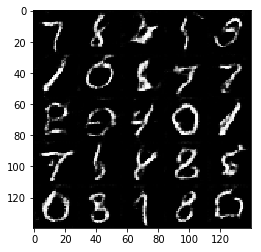

07/23/17 17:36:12  Epoch: 1/2  Step: 860  Generator Loss: 1.00  Discriminator Loss: 0.73 
07/23/17 17:36:12  Epoch: 1/2  Step: 870  Generator Loss: 0.65  Discriminator Loss: 0.93 
07/23/17 17:36:13  Epoch: 1/2  Step: 880  Generator Loss: 1.01  Discriminator Loss: 0.73 
07/23/17 17:36:13  Epoch: 1/2  Step: 890  Generator Loss: 0.80  Discriminator Loss: 0.84 
07/23/17 17:36:14  Epoch: 1/2  Step: 900  Generator Loss: 0.93  Discriminator Loss: 0.88 


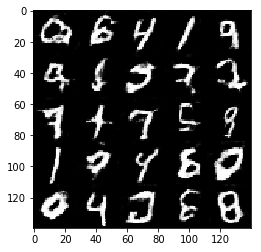

07/23/17 17:36:15  Epoch: 1/2  Step: 910  Generator Loss: 0.84  Discriminator Loss: 0.85 
07/23/17 17:36:15  Epoch: 1/2  Step: 920  Generator Loss: 0.94  Discriminator Loss: 0.79 
07/23/17 17:36:16  Epoch: 1/2  Step: 930  Generator Loss: 0.70  Discriminator Loss: 0.96 
07/23/17 17:36:16  Epoch: 2/2  Step: 940  Generator Loss: 0.77  Discriminator Loss: 0.92 
07/23/17 17:36:17  Epoch: 2/2  Step: 950  Generator Loss: 0.79  Discriminator Loss: 0.94 


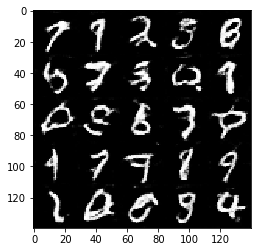

07/23/17 17:36:18  Epoch: 2/2  Step: 960  Generator Loss: 0.48  Discriminator Loss: 1.19 
07/23/17 17:36:18  Epoch: 2/2  Step: 970  Generator Loss: 0.35  Discriminator Loss: 1.48 
07/23/17 17:36:19  Epoch: 2/2  Step: 980  Generator Loss: 0.64  Discriminator Loss: 1.11 
07/23/17 17:36:19  Epoch: 2/2  Step: 990  Generator Loss: 1.69  Discriminator Loss: 0.71 
07/23/17 17:36:20  Epoch: 2/2  Step: 1000  Generator Loss: 1.24  Discriminator Loss: 0.67 


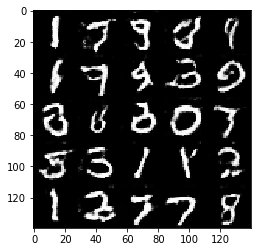

07/23/17 17:36:21  Epoch: 2/2  Step: 1010  Generator Loss: 0.43  Discriminator Loss: 1.44 
07/23/17 17:36:21  Epoch: 2/2  Step: 1020  Generator Loss: 0.38  Discriminator Loss: 1.42 
07/23/17 17:36:22  Epoch: 2/2  Step: 1030  Generator Loss: 1.05  Discriminator Loss: 0.92 
07/23/17 17:36:22  Epoch: 2/2  Step: 1040  Generator Loss: 2.41  Discriminator Loss: 1.09 
07/23/17 17:36:23  Epoch: 2/2  Step: 1050  Generator Loss: 1.08  Discriminator Loss: 1.08 


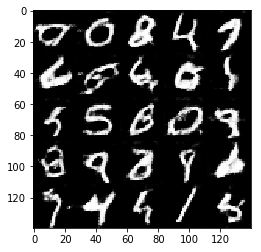

07/23/17 17:36:23  Epoch: 2/2  Step: 1060  Generator Loss: 0.63  Discriminator Loss: 1.10 
07/23/17 17:36:24  Epoch: 2/2  Step: 1070  Generator Loss: 0.82  Discriminator Loss: 0.98 
07/23/17 17:36:25  Epoch: 2/2  Step: 1080  Generator Loss: 0.72  Discriminator Loss: 1.02 
07/23/17 17:36:25  Epoch: 2/2  Step: 1090  Generator Loss: 1.97  Discriminator Loss: 0.78 
07/23/17 17:36:26  Epoch: 2/2  Step: 1100  Generator Loss: 1.28  Discriminator Loss: 0.68 


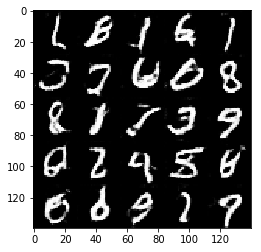

07/23/17 17:36:26  Epoch: 2/2  Step: 1110  Generator Loss: 0.68  Discriminator Loss: 0.94 
07/23/17 17:36:27  Epoch: 2/2  Step: 1120  Generator Loss: 1.78  Discriminator Loss: 1.10 
07/23/17 17:36:28  Epoch: 2/2  Step: 1130  Generator Loss: 0.36  Discriminator Loss: 1.47 
07/23/17 17:36:28  Epoch: 2/2  Step: 1140  Generator Loss: 0.45  Discriminator Loss: 1.29 
07/23/17 17:36:29  Epoch: 2/2  Step: 1150  Generator Loss: 1.39  Discriminator Loss: 0.59 


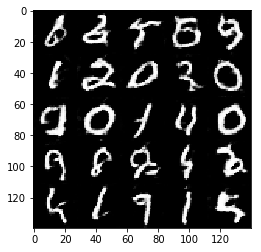

07/23/17 17:36:29  Epoch: 2/2  Step: 1160  Generator Loss: 1.24  Discriminator Loss: 0.76 
07/23/17 17:36:30  Epoch: 2/2  Step: 1170  Generator Loss: 0.74  Discriminator Loss: 0.92 
07/23/17 17:36:30  Epoch: 2/2  Step: 1180  Generator Loss: 0.38  Discriminator Loss: 1.51 
07/23/17 17:36:31  Epoch: 2/2  Step: 1190  Generator Loss: 0.70  Discriminator Loss: 1.00 
07/23/17 17:36:32  Epoch: 2/2  Step: 1200  Generator Loss: 1.30  Discriminator Loss: 0.66 


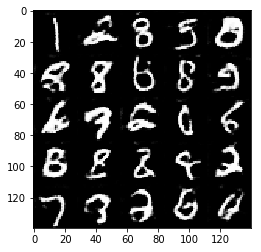

07/23/17 17:36:32  Epoch: 2/2  Step: 1210  Generator Loss: 1.02  Discriminator Loss: 0.76 
07/23/17 17:36:33  Epoch: 2/2  Step: 1220  Generator Loss: 0.62  Discriminator Loss: 1.03 
07/23/17 17:36:33  Epoch: 2/2  Step: 1230  Generator Loss: 0.54  Discriminator Loss: 1.14 
07/23/17 17:36:34  Epoch: 2/2  Step: 1240  Generator Loss: 1.66  Discriminator Loss: 0.75 
07/23/17 17:36:35  Epoch: 2/2  Step: 1250  Generator Loss: 0.38  Discriminator Loss: 1.40 


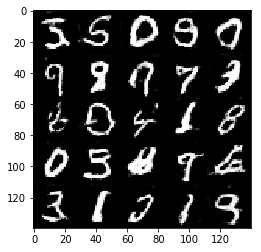

07/23/17 17:36:35  Epoch: 2/2  Step: 1260  Generator Loss: 1.03  Discriminator Loss: 0.93 
07/23/17 17:36:36  Epoch: 2/2  Step: 1270  Generator Loss: 1.70  Discriminator Loss: 0.61 
07/23/17 17:36:36  Epoch: 2/2  Step: 1280  Generator Loss: 0.70  Discriminator Loss: 1.00 
07/23/17 17:36:37  Epoch: 2/2  Step: 1290  Generator Loss: 1.02  Discriminator Loss: 0.79 
07/23/17 17:36:37  Epoch: 2/2  Step: 1300  Generator Loss: 0.63  Discriminator Loss: 1.00 


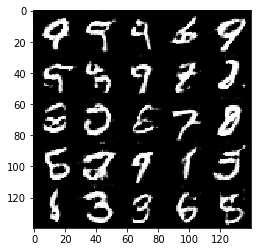

07/23/17 17:36:38  Epoch: 2/2  Step: 1310  Generator Loss: 2.04  Discriminator Loss: 0.74 
07/23/17 17:36:39  Epoch: 2/2  Step: 1320  Generator Loss: 1.13  Discriminator Loss: 0.65 
07/23/17 17:36:39  Epoch: 2/2  Step: 1330  Generator Loss: 0.31  Discriminator Loss: 1.67 
07/23/17 17:36:40  Epoch: 2/2  Step: 1340  Generator Loss: 0.43  Discriminator Loss: 1.31 
07/23/17 17:36:40  Epoch: 2/2  Step: 1350  Generator Loss: 1.47  Discriminator Loss: 0.61 


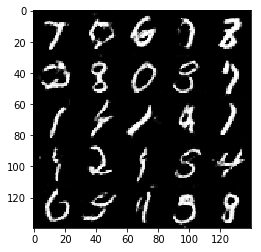

07/23/17 17:36:41  Epoch: 2/2  Step: 1360  Generator Loss: 1.23  Discriminator Loss: 0.68 
07/23/17 17:36:42  Epoch: 2/2  Step: 1370  Generator Loss: 1.20  Discriminator Loss: 0.66 
07/23/17 17:36:42  Epoch: 2/2  Step: 1380  Generator Loss: 1.99  Discriminator Loss: 0.67 
07/23/17 17:36:43  Epoch: 2/2  Step: 1390  Generator Loss: 0.72  Discriminator Loss: 0.90 
07/23/17 17:36:43  Epoch: 2/2  Step: 1400  Generator Loss: 1.56  Discriminator Loss: 0.53 


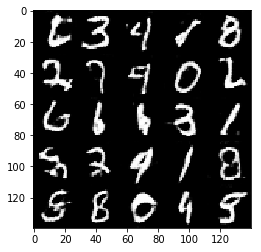

07/23/17 17:36:44  Epoch: 2/2  Step: 1410  Generator Loss: 0.78  Discriminator Loss: 0.88 
07/23/17 17:36:45  Epoch: 2/2  Step: 1420  Generator Loss: 0.51  Discriminator Loss: 1.18 
07/23/17 17:36:45  Epoch: 2/2  Step: 1430  Generator Loss: 0.58  Discriminator Loss: 1.07 
07/23/17 17:36:46  Epoch: 2/2  Step: 1440  Generator Loss: 1.62  Discriminator Loss: 0.50 
07/23/17 17:36:47  Epoch: 2/2  Step: 1450  Generator Loss: 0.90  Discriminator Loss: 0.78 


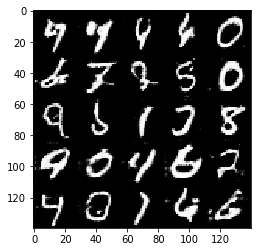

07/23/17 17:36:47  Epoch: 2/2  Step: 1460  Generator Loss: 2.03  Discriminator Loss: 0.62 
07/23/17 17:36:48  Epoch: 2/2  Step: 1470  Generator Loss: 0.95  Discriminator Loss: 0.77 
07/23/17 17:36:48  Epoch: 2/2  Step: 1480  Generator Loss: 0.91  Discriminator Loss: 0.83 
07/23/17 17:36:49  Epoch: 2/2  Step: 1490  Generator Loss: 0.41  Discriminator Loss: 1.46 
07/23/17 17:36:49  Epoch: 2/2  Step: 1500  Generator Loss: 1.60  Discriminator Loss: 0.54 


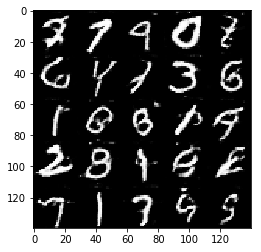

07/23/17 17:36:50  Epoch: 2/2  Step: 1510  Generator Loss: 0.71  Discriminator Loss: 0.90 
07/23/17 17:36:51  Epoch: 2/2  Step: 1520  Generator Loss: 0.51  Discriminator Loss: 1.44 
07/23/17 17:36:51  Epoch: 2/2  Step: 1530  Generator Loss: 0.81  Discriminator Loss: 0.89 
07/23/17 17:36:52  Epoch: 2/2  Step: 1540  Generator Loss: 1.19  Discriminator Loss: 0.61 
07/23/17 17:36:52  Epoch: 2/2  Step: 1550  Generator Loss: 1.01  Discriminator Loss: 0.70 


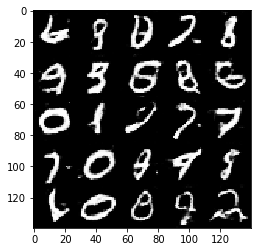

07/23/17 17:36:53  Epoch: 2/2  Step: 1560  Generator Loss: 3.28  Discriminator Loss: 1.31 
07/23/17 17:36:54  Epoch: 2/2  Step: 1570  Generator Loss: 1.21  Discriminator Loss: 0.65 
07/23/17 17:36:54  Epoch: 2/2  Step: 1580  Generator Loss: 1.52  Discriminator Loss: 0.50 
07/23/17 17:36:55  Epoch: 2/2  Step: 1590  Generator Loss: 0.67  Discriminator Loss: 1.01 
07/23/17 17:36:55  Epoch: 2/2  Step: 1600  Generator Loss: 0.90  Discriminator Loss: 0.78 


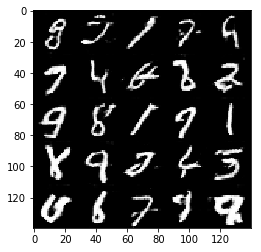

07/23/17 17:36:56  Epoch: 2/2  Step: 1610  Generator Loss: 1.08  Discriminator Loss: 0.62 
07/23/17 17:36:57  Epoch: 2/2  Step: 1620  Generator Loss: 1.31  Discriminator Loss: 0.70 
07/23/17 17:36:57  Epoch: 2/2  Step: 1630  Generator Loss: 0.33  Discriminator Loss: 1.47 
07/23/17 17:36:58  Epoch: 2/2  Step: 1640  Generator Loss: 0.81  Discriminator Loss: 0.89 
07/23/17 17:36:58  Epoch: 2/2  Step: 1650  Generator Loss: 1.40  Discriminator Loss: 0.67 


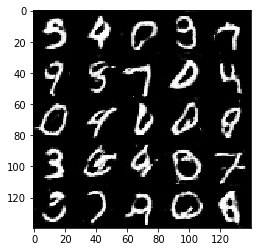

07/23/17 17:36:59  Epoch: 2/2  Step: 1660  Generator Loss: 0.98  Discriminator Loss: 0.77 
07/23/17 17:37:00  Epoch: 2/2  Step: 1670  Generator Loss: 1.01  Discriminator Loss: 0.71 
07/23/17 17:37:00  Epoch: 2/2  Step: 1680  Generator Loss: 1.04  Discriminator Loss: 0.69 
07/23/17 17:37:01  Epoch: 2/2  Step: 1690  Generator Loss: 1.15  Discriminator Loss: 0.73 
07/23/17 17:37:01  Epoch: 2/2  Step: 1700  Generator Loss: 0.61  Discriminator Loss: 1.13 


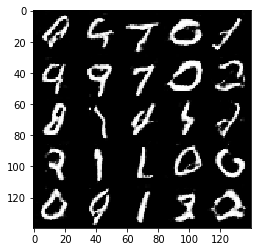

07/23/17 17:37:02  Epoch: 2/2  Step: 1710  Generator Loss: 0.90  Discriminator Loss: 0.80 
07/23/17 17:37:03  Epoch: 2/2  Step: 1720  Generator Loss: 0.54  Discriminator Loss: 1.16 
07/23/17 17:37:03  Epoch: 2/2  Step: 1730  Generator Loss: 0.45  Discriminator Loss: 1.30 
07/23/17 17:37:04  Epoch: 2/2  Step: 1740  Generator Loss: 1.09  Discriminator Loss: 0.74 
07/23/17 17:37:04  Epoch: 2/2  Step: 1750  Generator Loss: 0.81  Discriminator Loss: 0.80 


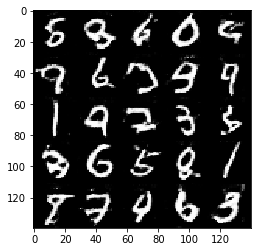

07/23/17 17:37:05  Epoch: 2/2  Step: 1760  Generator Loss: 1.36  Discriminator Loss: 0.57 
07/23/17 17:37:06  Epoch: 2/2  Step: 1770  Generator Loss: 1.42  Discriminator Loss: 0.90 
07/23/17 17:37:06  Epoch: 2/2  Step: 1780  Generator Loss: 1.22  Discriminator Loss: 0.61 
07/23/17 17:37:07  Epoch: 2/2  Step: 1790  Generator Loss: 0.89  Discriminator Loss: 0.81 
07/23/17 17:37:07  Epoch: 2/2  Step: 1800  Generator Loss: 0.83  Discriminator Loss: 0.77 


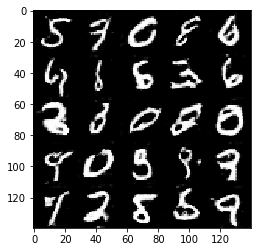

07/23/17 17:37:08  Epoch: 2/2  Step: 1810  Generator Loss: 1.45  Discriminator Loss: 0.58 
07/23/17 17:37:09  Epoch: 2/2  Step: 1820  Generator Loss: 0.60  Discriminator Loss: 1.11 
07/23/17 17:37:09  Epoch: 2/2  Step: 1830  Generator Loss: 0.64  Discriminator Loss: 1.04 
07/23/17 17:37:10  Epoch: 2/2  Step: 1840  Generator Loss: 1.03  Discriminator Loss: 0.71 
07/23/17 17:37:10  Epoch: 2/2  Step: 1850  Generator Loss: 2.58  Discriminator Loss: 0.87 


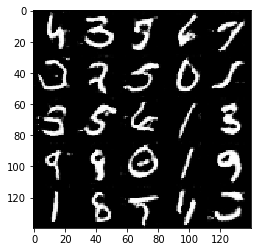

07/23/17 17:37:11  Epoch: 2/2  Step: 1860  Generator Loss: 1.63  Discriminator Loss: 0.78 
07/23/17 17:37:12  Epoch: 2/2  Step: 1870  Generator Loss: 1.51  Discriminator Loss: 0.59 


In [12]:
batch_size = 64
z_dim = 100
learning_rate = 0.0003
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

07/23/17 17:37:16  Epoch: 1/2  Step: 10  Generator Loss: 2.48  Discriminator Loss: 0.17 
07/23/17 17:37:17  Epoch: 1/2  Step: 20  Generator Loss: 3.18  Discriminator Loss: 0.14 
07/23/17 17:37:18  Epoch: 1/2  Step: 30  Generator Loss: 0.60  Discriminator Loss: 1.35 
07/23/17 17:37:19  Epoch: 1/2  Step: 40  Generator Loss: 2.14  Discriminator Loss: 0.54 
07/23/17 17:37:20  Epoch: 1/2  Step: 50  Generator Loss: 3.92  Discriminator Loss: 0.83 


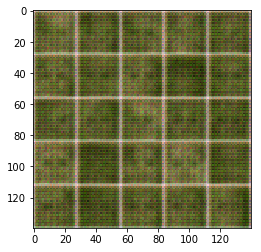

07/23/17 17:37:21  Epoch: 1/2  Step: 60  Generator Loss: 2.89  Discriminator Loss: 0.77 
07/23/17 17:37:22  Epoch: 1/2  Step: 70  Generator Loss: 0.28  Discriminator Loss: 1.65 
07/23/17 17:37:23  Epoch: 1/2  Step: 80  Generator Loss: 0.81  Discriminator Loss: 0.78 
07/23/17 17:37:24  Epoch: 1/2  Step: 90  Generator Loss: 6.48  Discriminator Loss: 1.73 
07/23/17 17:37:25  Epoch: 1/2  Step: 100  Generator Loss: 1.79  Discriminator Loss: 0.46 


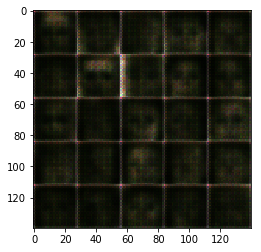

07/23/17 17:37:26  Epoch: 1/2  Step: 110  Generator Loss: 1.50  Discriminator Loss: 0.51 
07/23/17 17:37:27  Epoch: 1/2  Step: 120  Generator Loss: 4.64  Discriminator Loss: 0.65 
07/23/17 17:37:28  Epoch: 1/2  Step: 130  Generator Loss: 1.62  Discriminator Loss: 0.52 
07/23/17 17:37:29  Epoch: 1/2  Step: 140  Generator Loss: 0.61  Discriminator Loss: 1.09 
07/23/17 17:37:29  Epoch: 1/2  Step: 150  Generator Loss: 1.72  Discriminator Loss: 0.56 


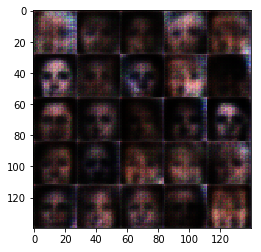

07/23/17 17:37:31  Epoch: 1/2  Step: 160  Generator Loss: 1.86  Discriminator Loss: 0.27 
07/23/17 17:37:32  Epoch: 1/2  Step: 170  Generator Loss: 1.27  Discriminator Loss: 0.71 
07/23/17 17:37:32  Epoch: 1/2  Step: 180  Generator Loss: 1.74  Discriminator Loss: 0.42 
07/23/17 17:37:33  Epoch: 1/2  Step: 190  Generator Loss: 1.51  Discriminator Loss: 0.44 
07/23/17 17:37:34  Epoch: 1/2  Step: 200  Generator Loss: 0.34  Discriminator Loss: 1.44 


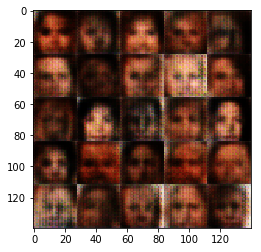

07/23/17 17:37:35  Epoch: 1/2  Step: 210  Generator Loss: 3.05  Discriminator Loss: 0.47 
07/23/17 17:37:36  Epoch: 1/2  Step: 220  Generator Loss: 2.21  Discriminator Loss: 0.93 
07/23/17 17:37:37  Epoch: 1/2  Step: 230  Generator Loss: 7.13  Discriminator Loss: 1.40 
07/23/17 17:37:38  Epoch: 1/2  Step: 240  Generator Loss: 1.96  Discriminator Loss: 0.62 
07/23/17 17:37:39  Epoch: 1/2  Step: 250  Generator Loss: 0.56  Discriminator Loss: 1.19 


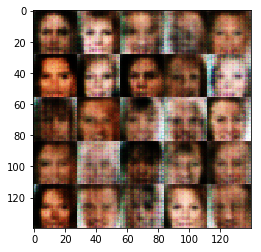

07/23/17 17:37:40  Epoch: 1/2  Step: 260  Generator Loss: 0.72  Discriminator Loss: 0.94 
07/23/17 17:37:41  Epoch: 1/2  Step: 270  Generator Loss: 0.89  Discriminator Loss: 0.84 
07/23/17 17:37:42  Epoch: 1/2  Step: 280  Generator Loss: 2.93  Discriminator Loss: 0.53 
07/23/17 17:37:43  Epoch: 1/2  Step: 290  Generator Loss: 2.79  Discriminator Loss: 0.30 
07/23/17 17:37:44  Epoch: 1/2  Step: 300  Generator Loss: 3.01  Discriminator Loss: 1.47 


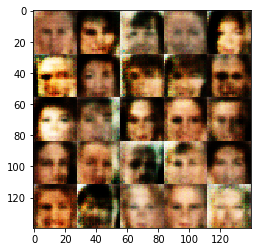

07/23/17 17:37:45  Epoch: 1/2  Step: 310  Generator Loss: 0.85  Discriminator Loss: 0.96 
07/23/17 17:37:46  Epoch: 1/2  Step: 320  Generator Loss: 1.37  Discriminator Loss: 0.80 
07/23/17 17:37:47  Epoch: 1/2  Step: 330  Generator Loss: 2.47  Discriminator Loss: 0.27 
07/23/17 17:37:48  Epoch: 1/2  Step: 340  Generator Loss: 0.29  Discriminator Loss: 1.79 
07/23/17 17:37:49  Epoch: 1/2  Step: 350  Generator Loss: 0.88  Discriminator Loss: 0.78 


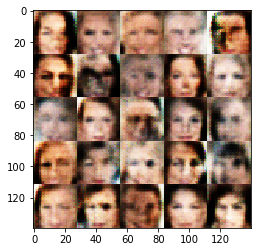

07/23/17 17:37:50  Epoch: 1/2  Step: 360  Generator Loss: 3.53  Discriminator Loss: 0.37 
07/23/17 17:37:51  Epoch: 1/2  Step: 370  Generator Loss: 0.64  Discriminator Loss: 1.13 
07/23/17 17:37:51  Epoch: 1/2  Step: 380  Generator Loss: 2.01  Discriminator Loss: 0.36 
07/23/17 17:37:52  Epoch: 1/2  Step: 390  Generator Loss: 3.90  Discriminator Loss: 0.51 
07/23/17 17:37:53  Epoch: 1/2  Step: 400  Generator Loss: 1.86  Discriminator Loss: 1.06 


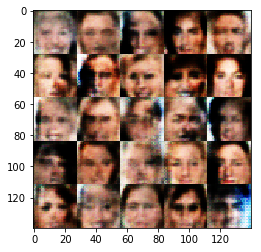

07/23/17 17:37:55  Epoch: 1/2  Step: 410  Generator Loss: 1.96  Discriminator Loss: 0.51 
07/23/17 17:37:55  Epoch: 1/2  Step: 420  Generator Loss: 1.08  Discriminator Loss: 0.55 
07/23/17 17:37:56  Epoch: 1/2  Step: 430  Generator Loss: 1.95  Discriminator Loss: 0.48 
07/23/17 17:37:57  Epoch: 1/2  Step: 440  Generator Loss: 0.25  Discriminator Loss: 1.84 
07/23/17 17:37:58  Epoch: 1/2  Step: 450  Generator Loss: 1.46  Discriminator Loss: 0.66 


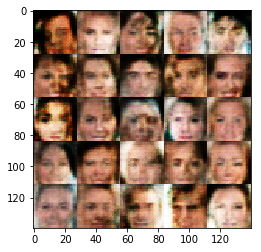

07/23/17 17:37:59  Epoch: 1/2  Step: 460  Generator Loss: 0.22  Discriminator Loss: 1.94 
07/23/17 17:38:00  Epoch: 1/2  Step: 470  Generator Loss: 1.28  Discriminator Loss: 0.65 
07/23/17 17:38:01  Epoch: 1/2  Step: 480  Generator Loss: 0.89  Discriminator Loss: 0.86 
07/23/17 17:38:02  Epoch: 1/2  Step: 490  Generator Loss: 6.37  Discriminator Loss: 0.73 
07/23/17 17:38:03  Epoch: 1/2  Step: 500  Generator Loss: 1.34  Discriminator Loss: 0.52 


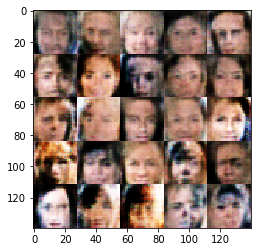

07/23/17 17:38:04  Epoch: 1/2  Step: 510  Generator Loss: 2.91  Discriminator Loss: 0.34 
07/23/17 17:38:05  Epoch: 1/2  Step: 520  Generator Loss: 0.74  Discriminator Loss: 0.87 
07/23/17 17:38:06  Epoch: 1/2  Step: 530  Generator Loss: 2.37  Discriminator Loss: 1.06 
07/23/17 17:38:07  Epoch: 1/2  Step: 540  Generator Loss: 2.99  Discriminator Loss: 0.24 
07/23/17 17:38:08  Epoch: 1/2  Step: 550  Generator Loss: 1.15  Discriminator Loss: 0.87 


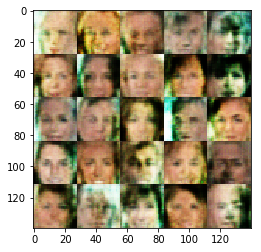

07/23/17 17:38:09  Epoch: 1/2  Step: 560  Generator Loss: 1.33  Discriminator Loss: 0.66 
07/23/17 17:38:10  Epoch: 1/2  Step: 570  Generator Loss: 1.51  Discriminator Loss: 0.57 
07/23/17 17:38:11  Epoch: 1/2  Step: 580  Generator Loss: 2.86  Discriminator Loss: 0.69 
07/23/17 17:38:12  Epoch: 1/2  Step: 590  Generator Loss: 4.19  Discriminator Loss: 1.09 
07/23/17 17:38:12  Epoch: 1/2  Step: 600  Generator Loss: 0.71  Discriminator Loss: 0.95 


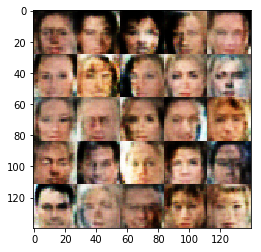

07/23/17 17:38:14  Epoch: 1/2  Step: 610  Generator Loss: 1.57  Discriminator Loss: 0.55 
07/23/17 17:38:15  Epoch: 1/2  Step: 620  Generator Loss: 0.40  Discriminator Loss: 1.42 
07/23/17 17:38:15  Epoch: 1/2  Step: 630  Generator Loss: 2.93  Discriminator Loss: 1.43 
07/23/17 17:38:16  Epoch: 1/2  Step: 640  Generator Loss: 0.29  Discriminator Loss: 1.77 
07/23/17 17:38:17  Epoch: 1/2  Step: 650  Generator Loss: 0.98  Discriminator Loss: 0.71 


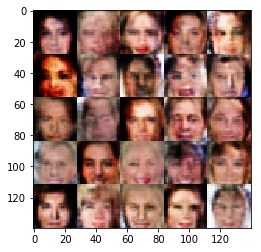

07/23/17 17:38:18  Epoch: 1/2  Step: 660  Generator Loss: 1.19  Discriminator Loss: 0.65 
07/23/17 17:38:19  Epoch: 1/2  Step: 670  Generator Loss: 0.41  Discriminator Loss: 1.37 
07/23/17 17:38:20  Epoch: 1/2  Step: 680  Generator Loss: 4.21  Discriminator Loss: 0.76 
07/23/17 17:38:21  Epoch: 1/2  Step: 690  Generator Loss: 0.40  Discriminator Loss: 1.39 
07/23/17 17:38:22  Epoch: 1/2  Step: 700  Generator Loss: 1.12  Discriminator Loss: 0.63 


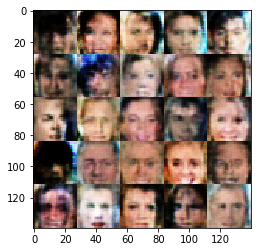

07/23/17 17:38:23  Epoch: 1/2  Step: 710  Generator Loss: 0.89  Discriminator Loss: 0.75 
07/23/17 17:38:24  Epoch: 1/2  Step: 720  Generator Loss: 0.61  Discriminator Loss: 1.14 
07/23/17 17:38:25  Epoch: 1/2  Step: 730  Generator Loss: 1.13  Discriminator Loss: 0.66 
07/23/17 17:38:26  Epoch: 1/2  Step: 740  Generator Loss: 1.32  Discriminator Loss: 0.93 
07/23/17 17:38:27  Epoch: 1/2  Step: 750  Generator Loss: 1.68  Discriminator Loss: 0.72 


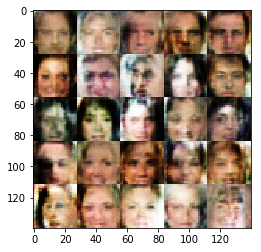

07/23/17 17:38:28  Epoch: 1/2  Step: 760  Generator Loss: 2.51  Discriminator Loss: 0.53 
07/23/17 17:38:29  Epoch: 1/2  Step: 770  Generator Loss: 1.08  Discriminator Loss: 0.70 
07/23/17 17:38:30  Epoch: 1/2  Step: 780  Generator Loss: 2.39  Discriminator Loss: 1.01 
07/23/17 17:38:31  Epoch: 1/2  Step: 790  Generator Loss: 1.39  Discriminator Loss: 0.51 
07/23/17 17:38:32  Epoch: 1/2  Step: 800  Generator Loss: 0.26  Discriminator Loss: 1.83 


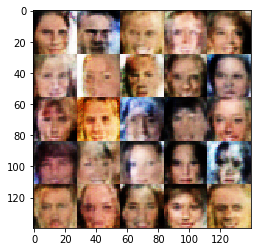

07/23/17 17:38:33  Epoch: 1/2  Step: 810  Generator Loss: 1.99  Discriminator Loss: 0.43 
07/23/17 17:38:34  Epoch: 1/2  Step: 820  Generator Loss: 2.10  Discriminator Loss: 1.08 
07/23/17 17:38:35  Epoch: 1/2  Step: 830  Generator Loss: 1.88  Discriminator Loss: 0.60 
07/23/17 17:38:35  Epoch: 1/2  Step: 840  Generator Loss: 0.34  Discriminator Loss: 1.47 
07/23/17 17:38:36  Epoch: 1/2  Step: 850  Generator Loss: 1.40  Discriminator Loss: 0.63 


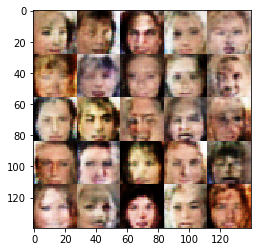

07/23/17 17:38:38  Epoch: 1/2  Step: 860  Generator Loss: 0.29  Discriminator Loss: 1.78 
07/23/17 17:38:38  Epoch: 1/2  Step: 870  Generator Loss: 0.56  Discriminator Loss: 1.12 
07/23/17 17:38:39  Epoch: 1/2  Step: 880  Generator Loss: 0.68  Discriminator Loss: 1.09 
07/23/17 17:38:40  Epoch: 1/2  Step: 890  Generator Loss: 0.56  Discriminator Loss: 1.19 
07/23/17 17:38:41  Epoch: 1/2  Step: 900  Generator Loss: 1.78  Discriminator Loss: 0.34 


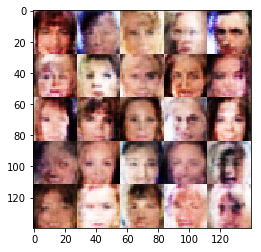

07/23/17 17:38:42  Epoch: 1/2  Step: 910  Generator Loss: 0.63  Discriminator Loss: 1.02 
07/23/17 17:38:43  Epoch: 1/2  Step: 920  Generator Loss: 0.91  Discriminator Loss: 1.00 
07/23/17 17:38:44  Epoch: 1/2  Step: 930  Generator Loss: 0.75  Discriminator Loss: 0.93 
07/23/17 17:38:45  Epoch: 1/2  Step: 940  Generator Loss: 2.67  Discriminator Loss: 0.66 
07/23/17 17:38:46  Epoch: 1/2  Step: 950  Generator Loss: 2.48  Discriminator Loss: 0.40 


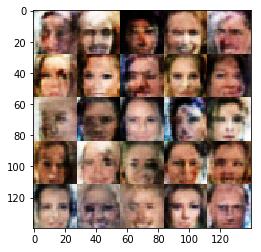

07/23/17 17:38:47  Epoch: 1/2  Step: 960  Generator Loss: 3.07  Discriminator Loss: 0.36 
07/23/17 17:38:48  Epoch: 1/2  Step: 970  Generator Loss: 0.78  Discriminator Loss: 0.87 
07/23/17 17:38:49  Epoch: 1/2  Step: 980  Generator Loss: 0.45  Discriminator Loss: 1.29 
07/23/17 17:38:50  Epoch: 1/2  Step: 990  Generator Loss: 1.67  Discriminator Loss: 0.95 
07/23/17 17:38:51  Epoch: 1/2  Step: 1000  Generator Loss: 2.12  Discriminator Loss: 0.62 


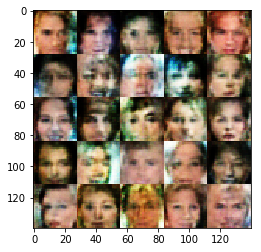

07/23/17 17:38:52  Epoch: 1/2  Step: 1010  Generator Loss: 0.41  Discriminator Loss: 1.34 
07/23/17 17:38:53  Epoch: 1/2  Step: 1020  Generator Loss: 0.84  Discriminator Loss: 0.90 
07/23/17 17:38:54  Epoch: 1/2  Step: 1030  Generator Loss: 0.40  Discriminator Loss: 1.32 
07/23/17 17:38:55  Epoch: 1/2  Step: 1040  Generator Loss: 1.04  Discriminator Loss: 0.74 
07/23/17 17:38:56  Epoch: 1/2  Step: 1050  Generator Loss: 1.67  Discriminator Loss: 0.37 


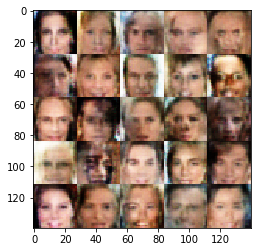

07/23/17 17:38:57  Epoch: 1/2  Step: 1060  Generator Loss: 1.77  Discriminator Loss: 0.87 
07/23/17 17:38:58  Epoch: 1/2  Step: 1070  Generator Loss: 0.89  Discriminator Loss: 0.84 
07/23/17 17:38:59  Epoch: 1/2  Step: 1080  Generator Loss: 1.46  Discriminator Loss: 0.78 
07/23/17 17:38:59  Epoch: 1/2  Step: 1090  Generator Loss: 0.49  Discriminator Loss: 1.23 
07/23/17 17:39:00  Epoch: 1/2  Step: 1100  Generator Loss: 1.74  Discriminator Loss: 0.51 


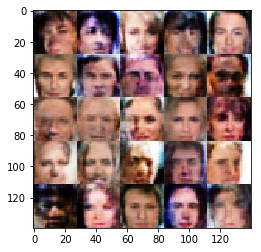

07/23/17 17:39:02  Epoch: 1/2  Step: 1110  Generator Loss: 0.55  Discriminator Loss: 1.15 
07/23/17 17:39:02  Epoch: 1/2  Step: 1120  Generator Loss: 0.94  Discriminator Loss: 0.72 
07/23/17 17:39:03  Epoch: 1/2  Step: 1130  Generator Loss: 1.98  Discriminator Loss: 0.30 
07/23/17 17:39:04  Epoch: 1/2  Step: 1140  Generator Loss: 1.25  Discriminator Loss: 0.56 
07/23/17 17:39:05  Epoch: 1/2  Step: 1150  Generator Loss: 2.00  Discriminator Loss: 1.14 


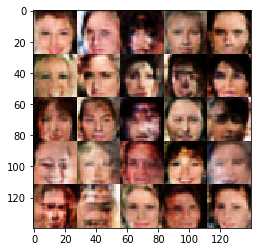

07/23/17 17:39:06  Epoch: 1/2  Step: 1160  Generator Loss: 2.88  Discriminator Loss: 0.25 
07/23/17 17:39:07  Epoch: 1/2  Step: 1170  Generator Loss: 0.48  Discriminator Loss: 1.20 
07/23/17 17:39:08  Epoch: 1/2  Step: 1180  Generator Loss: 1.07  Discriminator Loss: 0.83 
07/23/17 17:39:09  Epoch: 1/2  Step: 1190  Generator Loss: 0.88  Discriminator Loss: 0.85 
07/23/17 17:39:10  Epoch: 1/2  Step: 1200  Generator Loss: 0.67  Discriminator Loss: 0.94 


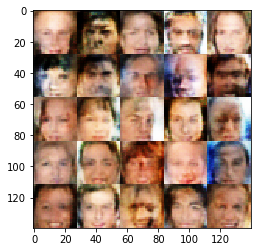

07/23/17 17:39:11  Epoch: 1/2  Step: 1210  Generator Loss: 1.28  Discriminator Loss: 1.05 
07/23/17 17:39:12  Epoch: 1/2  Step: 1220  Generator Loss: 2.41  Discriminator Loss: 0.92 
07/23/17 17:39:13  Epoch: 1/2  Step: 1230  Generator Loss: 1.56  Discriminator Loss: 0.56 
07/23/17 17:39:14  Epoch: 1/2  Step: 1240  Generator Loss: 2.12  Discriminator Loss: 0.39 
07/23/17 17:39:15  Epoch: 1/2  Step: 1250  Generator Loss: 2.32  Discriminator Loss: 1.22 


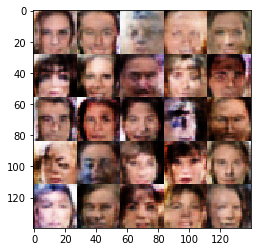

07/23/17 17:39:16  Epoch: 1/2  Step: 1260  Generator Loss: 0.23  Discriminator Loss: 1.86 
07/23/17 17:39:17  Epoch: 1/2  Step: 1270  Generator Loss: 2.27  Discriminator Loss: 1.37 
07/23/17 17:39:18  Epoch: 1/2  Step: 1280  Generator Loss: 2.80  Discriminator Loss: 0.54 
07/23/17 17:39:19  Epoch: 1/2  Step: 1290  Generator Loss: 1.72  Discriminator Loss: 0.47 
07/23/17 17:39:20  Epoch: 1/2  Step: 1300  Generator Loss: 0.89  Discriminator Loss: 0.84 


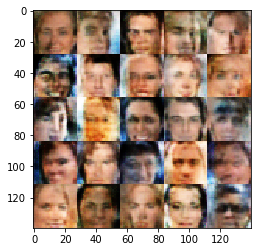

07/23/17 17:39:21  Epoch: 1/2  Step: 1310  Generator Loss: 1.55  Discriminator Loss: 1.15 
07/23/17 17:39:22  Epoch: 1/2  Step: 1320  Generator Loss: 0.20  Discriminator Loss: 1.95 
07/23/17 17:39:23  Epoch: 1/2  Step: 1330  Generator Loss: 0.77  Discriminator Loss: 0.89 
07/23/17 17:39:23  Epoch: 1/2  Step: 1340  Generator Loss: 0.41  Discriminator Loss: 1.44 
07/23/17 17:39:24  Epoch: 1/2  Step: 1350  Generator Loss: 0.49  Discriminator Loss: 1.17 


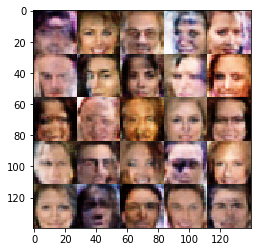

07/23/17 17:39:26  Epoch: 1/2  Step: 1360  Generator Loss: 1.58  Discriminator Loss: 0.58 
07/23/17 17:39:26  Epoch: 1/2  Step: 1370  Generator Loss: 0.76  Discriminator Loss: 0.98 
07/23/17 17:39:27  Epoch: 1/2  Step: 1380  Generator Loss: 3.47  Discriminator Loss: 0.29 
07/23/17 17:39:28  Epoch: 1/2  Step: 1390  Generator Loss: 2.84  Discriminator Loss: 0.42 
07/23/17 17:39:29  Epoch: 1/2  Step: 1400  Generator Loss: 2.74  Discriminator Loss: 1.70 


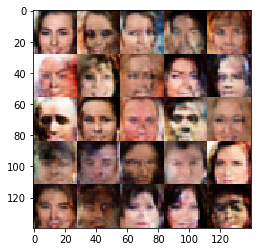

07/23/17 17:39:30  Epoch: 1/2  Step: 1410  Generator Loss: 0.74  Discriminator Loss: 0.95 
07/23/17 17:39:31  Epoch: 1/2  Step: 1420  Generator Loss: 0.42  Discriminator Loss: 1.43 
07/23/17 17:39:32  Epoch: 1/2  Step: 1430  Generator Loss: 0.45  Discriminator Loss: 1.28 
07/23/17 17:39:33  Epoch: 1/2  Step: 1440  Generator Loss: 1.53  Discriminator Loss: 0.88 
07/23/17 17:39:34  Epoch: 1/2  Step: 1450  Generator Loss: 2.56  Discriminator Loss: 0.34 


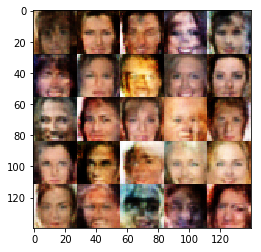

07/23/17 17:39:35  Epoch: 1/2  Step: 1460  Generator Loss: 2.39  Discriminator Loss: 0.80 
07/23/17 17:39:36  Epoch: 1/2  Step: 1470  Generator Loss: 0.38  Discriminator Loss: 1.41 
07/23/17 17:39:37  Epoch: 1/2  Step: 1480  Generator Loss: 0.41  Discriminator Loss: 1.37 
07/23/17 17:39:38  Epoch: 1/2  Step: 1490  Generator Loss: 0.70  Discriminator Loss: 0.92 
07/23/17 17:39:39  Epoch: 1/2  Step: 1500  Generator Loss: 1.48  Discriminator Loss: 0.73 


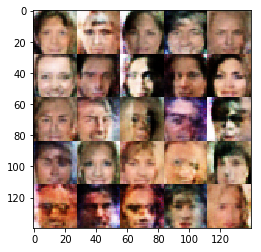

07/23/17 17:39:40  Epoch: 1/2  Step: 1510  Generator Loss: 0.43  Discriminator Loss: 1.48 
07/23/17 17:39:41  Epoch: 1/2  Step: 1520  Generator Loss: 2.19  Discriminator Loss: 1.08 
07/23/17 17:39:42  Epoch: 1/2  Step: 1530  Generator Loss: 1.89  Discriminator Loss: 0.39 
07/23/17 17:39:43  Epoch: 1/2  Step: 1540  Generator Loss: 1.15  Discriminator Loss: 0.76 
07/23/17 17:39:44  Epoch: 1/2  Step: 1550  Generator Loss: 1.58  Discriminator Loss: 0.46 


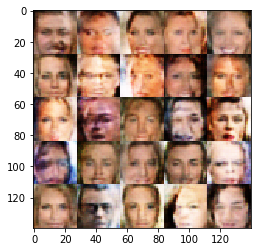

07/23/17 17:39:45  Epoch: 1/2  Step: 1560  Generator Loss: 2.56  Discriminator Loss: 0.36 
07/23/17 17:39:46  Epoch: 1/2  Step: 1570  Generator Loss: 1.96  Discriminator Loss: 0.53 
07/23/17 17:39:47  Epoch: 1/2  Step: 1580  Generator Loss: 1.97  Discriminator Loss: 0.92 
07/23/17 17:39:47  Epoch: 1/2  Step: 1590  Generator Loss: 1.41  Discriminator Loss: 0.62 
07/23/17 17:39:48  Epoch: 1/2  Step: 1600  Generator Loss: 1.47  Discriminator Loss: 0.61 


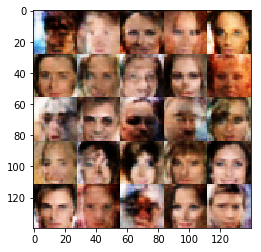

07/23/17 17:39:50  Epoch: 1/2  Step: 1610  Generator Loss: 1.16  Discriminator Loss: 0.66 
07/23/17 17:39:50  Epoch: 1/2  Step: 1620  Generator Loss: 1.41  Discriminator Loss: 0.53 
07/23/17 17:39:51  Epoch: 1/2  Step: 1630  Generator Loss: 0.81  Discriminator Loss: 0.94 
07/23/17 17:39:52  Epoch: 1/2  Step: 1640  Generator Loss: 2.72  Discriminator Loss: 2.05 
07/23/17 17:39:53  Epoch: 1/2  Step: 1650  Generator Loss: 1.49  Discriminator Loss: 0.45 


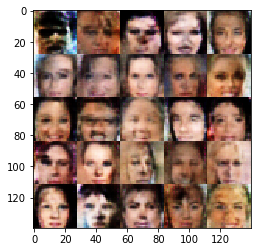

07/23/17 17:39:54  Epoch: 1/2  Step: 1660  Generator Loss: 1.21  Discriminator Loss: 0.71 
07/23/17 17:39:55  Epoch: 1/2  Step: 1670  Generator Loss: 1.88  Discriminator Loss: 0.32 
07/23/17 17:39:56  Epoch: 1/2  Step: 1680  Generator Loss: 1.21  Discriminator Loss: 0.61 
07/23/17 17:39:57  Epoch: 1/2  Step: 1690  Generator Loss: 1.31  Discriminator Loss: 0.87 
07/23/17 17:39:58  Epoch: 1/2  Step: 1700  Generator Loss: 0.75  Discriminator Loss: 0.90 


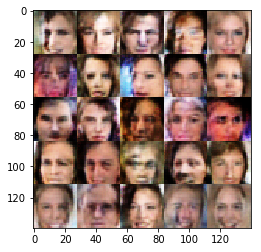

07/23/17 17:39:59  Epoch: 1/2  Step: 1710  Generator Loss: 1.47  Discriminator Loss: 0.55 
07/23/17 17:40:00  Epoch: 1/2  Step: 1720  Generator Loss: 2.20  Discriminator Loss: 0.31 
07/23/17 17:40:01  Epoch: 1/2  Step: 1730  Generator Loss: 1.05  Discriminator Loss: 1.01 
07/23/17 17:40:02  Epoch: 1/2  Step: 1740  Generator Loss: 0.27  Discriminator Loss: 1.74 
07/23/17 17:40:03  Epoch: 1/2  Step: 1750  Generator Loss: 0.95  Discriminator Loss: 0.80 


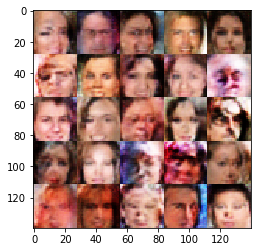

07/23/17 17:40:04  Epoch: 1/2  Step: 1760  Generator Loss: 1.64  Discriminator Loss: 0.57 
07/23/17 17:40:05  Epoch: 1/2  Step: 1770  Generator Loss: 1.20  Discriminator Loss: 0.94 
07/23/17 17:40:06  Epoch: 1/2  Step: 1780  Generator Loss: 0.36  Discriminator Loss: 1.45 
07/23/17 17:40:07  Epoch: 1/2  Step: 1790  Generator Loss: 1.35  Discriminator Loss: 0.49 
07/23/17 17:40:08  Epoch: 1/2  Step: 1800  Generator Loss: 1.26  Discriminator Loss: 0.60 


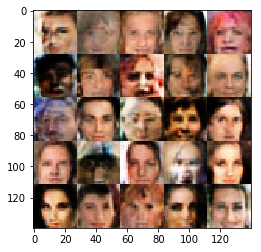

07/23/17 17:40:09  Epoch: 1/2  Step: 1810  Generator Loss: 2.00  Discriminator Loss: 0.67 
07/23/17 17:40:10  Epoch: 1/2  Step: 1820  Generator Loss: 0.65  Discriminator Loss: 1.07 
07/23/17 17:40:11  Epoch: 1/2  Step: 1830  Generator Loss: 0.98  Discriminator Loss: 0.75 
07/23/17 17:40:12  Epoch: 1/2  Step: 1840  Generator Loss: 0.50  Discriminator Loss: 1.21 
07/23/17 17:40:13  Epoch: 1/2  Step: 1850  Generator Loss: 1.17  Discriminator Loss: 0.66 


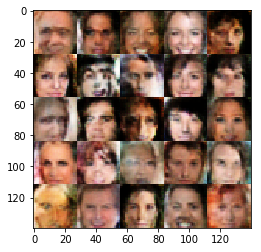

07/23/17 17:40:14  Epoch: 1/2  Step: 1860  Generator Loss: 2.43  Discriminator Loss: 0.33 
07/23/17 17:40:15  Epoch: 1/2  Step: 1870  Generator Loss: 0.18  Discriminator Loss: 2.03 
07/23/17 17:40:16  Epoch: 1/2  Step: 1880  Generator Loss: 1.55  Discriminator Loss: 0.43 
07/23/17 17:40:16  Epoch: 1/2  Step: 1890  Generator Loss: 1.62  Discriminator Loss: 0.67 
07/23/17 17:40:17  Epoch: 1/2  Step: 1900  Generator Loss: 0.84  Discriminator Loss: 0.90 


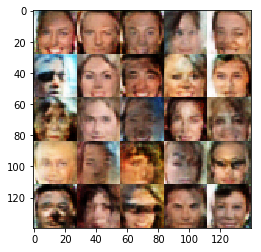

07/23/17 17:40:19  Epoch: 1/2  Step: 1910  Generator Loss: 0.71  Discriminator Loss: 1.18 
07/23/17 17:40:19  Epoch: 1/2  Step: 1920  Generator Loss: 1.32  Discriminator Loss: 0.90 
07/23/17 17:40:20  Epoch: 1/2  Step: 1930  Generator Loss: 1.41  Discriminator Loss: 0.92 
07/23/17 17:40:21  Epoch: 1/2  Step: 1940  Generator Loss: 0.84  Discriminator Loss: 0.77 
07/23/17 17:40:22  Epoch: 1/2  Step: 1950  Generator Loss: 2.00  Discriminator Loss: 0.99 


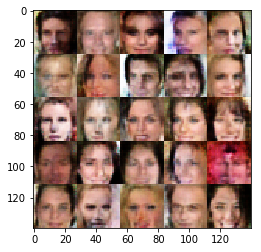

07/23/17 17:40:23  Epoch: 1/2  Step: 1960  Generator Loss: 1.79  Discriminator Loss: 0.57 
07/23/17 17:40:24  Epoch: 1/2  Step: 1970  Generator Loss: 1.43  Discriminator Loss: 0.91 
07/23/17 17:40:25  Epoch: 1/2  Step: 1980  Generator Loss: 1.69  Discriminator Loss: 0.74 
07/23/17 17:40:26  Epoch: 1/2  Step: 1990  Generator Loss: 0.72  Discriminator Loss: 1.10 
07/23/17 17:40:27  Epoch: 1/2  Step: 2000  Generator Loss: 0.96  Discriminator Loss: 0.76 


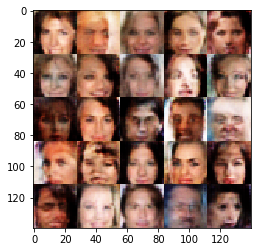

07/23/17 17:40:28  Epoch: 1/2  Step: 2010  Generator Loss: 0.97  Discriminator Loss: 0.70 
07/23/17 17:40:29  Epoch: 1/2  Step: 2020  Generator Loss: 0.67  Discriminator Loss: 0.95 
07/23/17 17:40:30  Epoch: 1/2  Step: 2030  Generator Loss: 2.38  Discriminator Loss: 0.32 
07/23/17 17:40:31  Epoch: 1/2  Step: 2040  Generator Loss: 1.27  Discriminator Loss: 0.57 
07/23/17 17:40:32  Epoch: 1/2  Step: 2050  Generator Loss: 2.01  Discriminator Loss: 0.27 


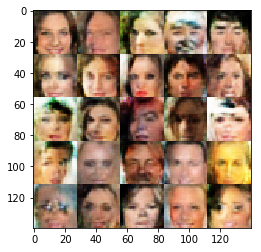

07/23/17 17:40:33  Epoch: 1/2  Step: 2060  Generator Loss: 0.26  Discriminator Loss: 1.71 
07/23/17 17:40:34  Epoch: 1/2  Step: 2070  Generator Loss: 1.72  Discriminator Loss: 0.43 
07/23/17 17:40:35  Epoch: 1/2  Step: 2080  Generator Loss: 2.26  Discriminator Loss: 0.74 
07/23/17 17:40:36  Epoch: 1/2  Step: 2090  Generator Loss: 0.79  Discriminator Loss: 0.85 
07/23/17 17:40:37  Epoch: 1/2  Step: 2100  Generator Loss: 0.92  Discriminator Loss: 0.92 


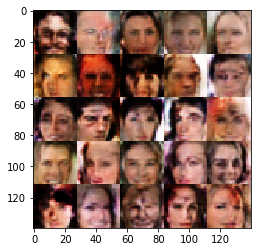

07/23/17 17:40:38  Epoch: 1/2  Step: 2110  Generator Loss: 2.12  Discriminator Loss: 0.35 
07/23/17 17:40:39  Epoch: 1/2  Step: 2120  Generator Loss: 0.55  Discriminator Loss: 1.15 
07/23/17 17:40:40  Epoch: 1/2  Step: 2130  Generator Loss: 0.82  Discriminator Loss: 0.86 
07/23/17 17:40:41  Epoch: 1/2  Step: 2140  Generator Loss: 0.58  Discriminator Loss: 1.07 
07/23/17 17:40:41  Epoch: 1/2  Step: 2150  Generator Loss: 1.48  Discriminator Loss: 0.50 


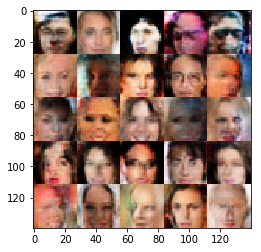

07/23/17 17:40:43  Epoch: 1/2  Step: 2160  Generator Loss: 1.73  Discriminator Loss: 0.69 
07/23/17 17:40:44  Epoch: 1/2  Step: 2170  Generator Loss: 1.87  Discriminator Loss: 0.68 
07/23/17 17:40:44  Epoch: 1/2  Step: 2180  Generator Loss: 1.19  Discriminator Loss: 0.85 
07/23/17 17:40:45  Epoch: 1/2  Step: 2190  Generator Loss: 2.18  Discriminator Loss: 0.83 
07/23/17 17:40:46  Epoch: 1/2  Step: 2200  Generator Loss: 1.61  Discriminator Loss: 0.44 


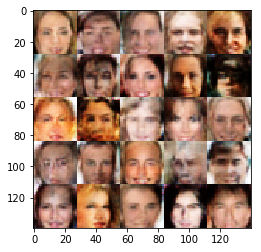

07/23/17 17:40:48  Epoch: 1/2  Step: 2210  Generator Loss: 0.55  Discriminator Loss: 1.08 
07/23/17 17:40:48  Epoch: 1/2  Step: 2220  Generator Loss: 1.18  Discriminator Loss: 0.82 
07/23/17 17:40:49  Epoch: 1/2  Step: 2230  Generator Loss: 1.54  Discriminator Loss: 0.65 
07/23/17 17:40:50  Epoch: 1/2  Step: 2240  Generator Loss: 2.55  Discriminator Loss: 1.09 
07/23/17 17:40:51  Epoch: 1/2  Step: 2250  Generator Loss: 1.34  Discriminator Loss: 0.79 


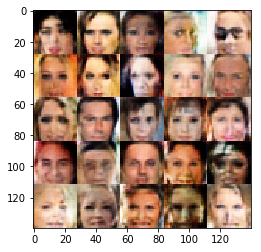

07/23/17 17:40:52  Epoch: 1/2  Step: 2260  Generator Loss: 2.62  Discriminator Loss: 0.39 
07/23/17 17:40:53  Epoch: 1/2  Step: 2270  Generator Loss: 2.08  Discriminator Loss: 0.41 
07/23/17 17:40:54  Epoch: 1/2  Step: 2280  Generator Loss: 1.63  Discriminator Loss: 0.38 
07/23/17 17:40:55  Epoch: 1/2  Step: 2290  Generator Loss: 1.18  Discriminator Loss: 0.63 
07/23/17 17:40:56  Epoch: 1/2  Step: 2300  Generator Loss: 1.89  Discriminator Loss: 0.37 


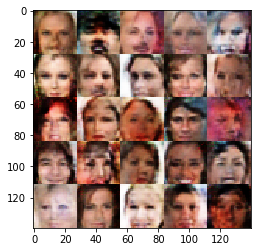

07/23/17 17:40:57  Epoch: 1/2  Step: 2310  Generator Loss: 1.88  Discriminator Loss: 0.94 
07/23/17 17:40:58  Epoch: 1/2  Step: 2320  Generator Loss: 1.51  Discriminator Loss: 0.51 
07/23/17 17:40:59  Epoch: 1/2  Step: 2330  Generator Loss: 3.19  Discriminator Loss: 0.64 
07/23/17 17:41:00  Epoch: 1/2  Step: 2340  Generator Loss: 0.41  Discriminator Loss: 1.31 
07/23/17 17:41:01  Epoch: 1/2  Step: 2350  Generator Loss: 1.27  Discriminator Loss: 0.62 


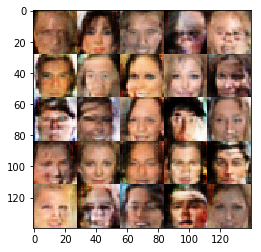

07/23/17 17:41:02  Epoch: 1/2  Step: 2360  Generator Loss: 2.72  Discriminator Loss: 0.36 
07/23/17 17:41:03  Epoch: 1/2  Step: 2370  Generator Loss: 1.69  Discriminator Loss: 0.71 
07/23/17 17:41:04  Epoch: 1/2  Step: 2380  Generator Loss: 1.54  Discriminator Loss: 0.96 
07/23/17 17:41:05  Epoch: 1/2  Step: 2390  Generator Loss: 0.48  Discriminator Loss: 1.26 
07/23/17 17:41:06  Epoch: 1/2  Step: 2400  Generator Loss: 0.91  Discriminator Loss: 0.80 


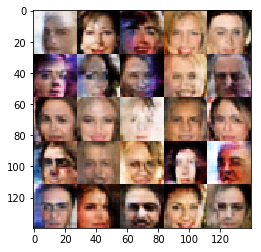

07/23/17 17:41:07  Epoch: 1/2  Step: 2410  Generator Loss: 1.61  Discriminator Loss: 0.41 
07/23/17 17:41:08  Epoch: 1/2  Step: 2420  Generator Loss: 0.47  Discriminator Loss: 1.22 
07/23/17 17:41:09  Epoch: 1/2  Step: 2430  Generator Loss: 1.78  Discriminator Loss: 1.05 
07/23/17 17:41:10  Epoch: 1/2  Step: 2440  Generator Loss: 0.60  Discriminator Loss: 1.08 
07/23/17 17:41:11  Epoch: 1/2  Step: 2450  Generator Loss: 0.61  Discriminator Loss: 0.97 


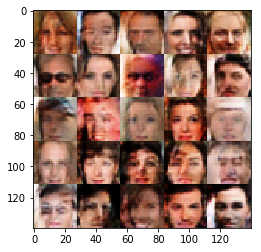

07/23/17 17:41:12  Epoch: 1/2  Step: 2460  Generator Loss: 0.57  Discriminator Loss: 1.05 
07/23/17 17:41:13  Epoch: 1/2  Step: 2470  Generator Loss: 1.45  Discriminator Loss: 0.81 
07/23/17 17:41:14  Epoch: 1/2  Step: 2480  Generator Loss: 1.21  Discriminator Loss: 0.64 
07/23/17 17:41:15  Epoch: 1/2  Step: 2490  Generator Loss: 0.80  Discriminator Loss: 0.91 
07/23/17 17:41:15  Epoch: 1/2  Step: 2500  Generator Loss: 0.88  Discriminator Loss: 0.77 


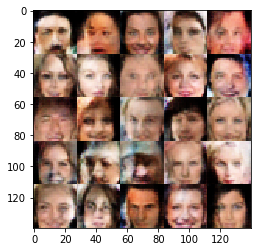

07/23/17 17:41:17  Epoch: 1/2  Step: 2510  Generator Loss: 0.71  Discriminator Loss: 0.91 
07/23/17 17:41:18  Epoch: 1/2  Step: 2520  Generator Loss: 1.00  Discriminator Loss: 0.85 
07/23/17 17:41:18  Epoch: 1/2  Step: 2530  Generator Loss: 1.81  Discriminator Loss: 0.67 
07/23/17 17:41:19  Epoch: 1/2  Step: 2540  Generator Loss: 1.35  Discriminator Loss: 0.76 
07/23/17 17:41:20  Epoch: 1/2  Step: 2550  Generator Loss: 0.58  Discriminator Loss: 1.07 


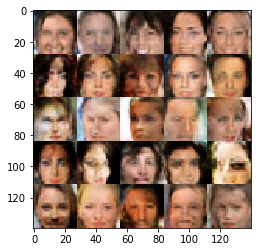

07/23/17 17:41:22  Epoch: 1/2  Step: 2560  Generator Loss: 1.04  Discriminator Loss: 0.82 
07/23/17 17:41:22  Epoch: 1/2  Step: 2570  Generator Loss: 1.28  Discriminator Loss: 0.82 
07/23/17 17:41:23  Epoch: 1/2  Step: 2580  Generator Loss: 2.37  Discriminator Loss: 0.29 
07/23/17 17:41:24  Epoch: 1/2  Step: 2590  Generator Loss: 0.95  Discriminator Loss: 0.81 
07/23/17 17:41:25  Epoch: 1/2  Step: 2600  Generator Loss: 0.91  Discriminator Loss: 0.79 


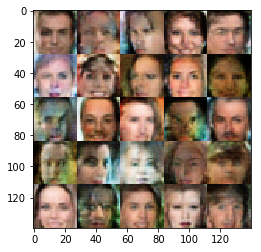

07/23/17 17:41:26  Epoch: 1/2  Step: 2610  Generator Loss: 0.95  Discriminator Loss: 0.80 
07/23/17 17:41:27  Epoch: 1/2  Step: 2620  Generator Loss: 2.00  Discriminator Loss: 0.49 
07/23/17 17:41:28  Epoch: 1/2  Step: 2630  Generator Loss: 1.03  Discriminator Loss: 0.66 
07/23/17 17:41:29  Epoch: 1/2  Step: 2640  Generator Loss: 0.58  Discriminator Loss: 1.04 
07/23/17 17:41:30  Epoch: 1/2  Step: 2650  Generator Loss: 4.51  Discriminator Loss: 0.34 


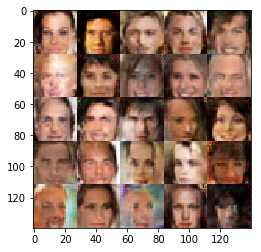

07/23/17 17:41:31  Epoch: 1/2  Step: 2660  Generator Loss: 2.34  Discriminator Loss: 0.37 
07/23/17 17:41:32  Epoch: 1/2  Step: 2670  Generator Loss: 0.50  Discriminator Loss: 1.18 
07/23/17 17:41:33  Epoch: 1/2  Step: 2680  Generator Loss: 4.26  Discriminator Loss: 0.69 
07/23/17 17:41:34  Epoch: 1/2  Step: 2690  Generator Loss: 1.75  Discriminator Loss: 0.92 
07/23/17 17:41:35  Epoch: 1/2  Step: 2700  Generator Loss: 1.23  Discriminator Loss: 0.62 


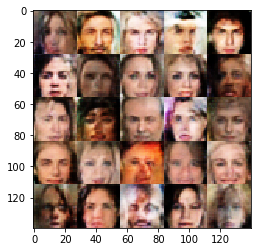

07/23/17 17:41:36  Epoch: 1/2  Step: 2710  Generator Loss: 0.58  Discriminator Loss: 1.15 
07/23/17 17:41:37  Epoch: 1/2  Step: 2720  Generator Loss: 0.52  Discriminator Loss: 1.19 
07/23/17 17:41:38  Epoch: 1/2  Step: 2730  Generator Loss: 0.91  Discriminator Loss: 0.70 
07/23/17 17:41:39  Epoch: 1/2  Step: 2740  Generator Loss: 1.74  Discriminator Loss: 0.45 
07/23/17 17:41:40  Epoch: 1/2  Step: 2750  Generator Loss: 0.65  Discriminator Loss: 0.95 


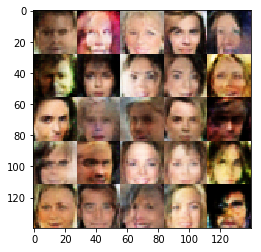

07/23/17 17:41:41  Epoch: 1/2  Step: 2760  Generator Loss: 0.92  Discriminator Loss: 1.16 
07/23/17 17:41:42  Epoch: 1/2  Step: 2770  Generator Loss: 1.30  Discriminator Loss: 0.65 
07/23/17 17:41:43  Epoch: 1/2  Step: 2780  Generator Loss: 2.97  Discriminator Loss: 2.20 
07/23/17 17:41:44  Epoch: 1/2  Step: 2790  Generator Loss: 0.37  Discriminator Loss: 1.38 
07/23/17 17:41:44  Epoch: 1/2  Step: 2800  Generator Loss: 0.34  Discriminator Loss: 1.47 


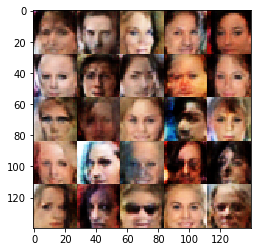

07/23/17 17:41:46  Epoch: 1/2  Step: 2810  Generator Loss: 2.11  Discriminator Loss: 0.48 
07/23/17 17:41:47  Epoch: 1/2  Step: 2820  Generator Loss: 2.25  Discriminator Loss: 0.42 
07/23/17 17:41:48  Epoch: 1/2  Step: 2830  Generator Loss: 1.18  Discriminator Loss: 0.96 
07/23/17 17:41:48  Epoch: 1/2  Step: 2840  Generator Loss: 2.10  Discriminator Loss: 0.30 
07/23/17 17:41:49  Epoch: 1/2  Step: 2850  Generator Loss: 1.32  Discriminator Loss: 0.68 


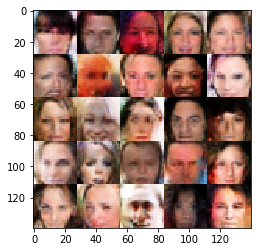

07/23/17 17:41:51  Epoch: 1/2  Step: 2860  Generator Loss: 0.58  Discriminator Loss: 1.04 
07/23/17 17:41:52  Epoch: 1/2  Step: 2870  Generator Loss: 0.83  Discriminator Loss: 0.78 
07/23/17 17:41:52  Epoch: 1/2  Step: 2880  Generator Loss: 0.18  Discriminator Loss: 2.09 
07/23/17 17:41:53  Epoch: 1/2  Step: 2890  Generator Loss: 1.01  Discriminator Loss: 0.89 
07/23/17 17:41:54  Epoch: 1/2  Step: 2900  Generator Loss: 0.39  Discriminator Loss: 1.41 


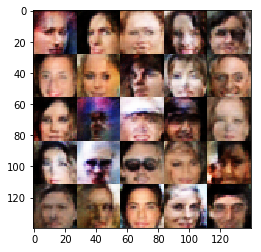

07/23/17 17:41:56  Epoch: 1/2  Step: 2910  Generator Loss: 1.54  Discriminator Loss: 0.75 
07/23/17 17:41:57  Epoch: 1/2  Step: 2920  Generator Loss: 1.39  Discriminator Loss: 0.69 
07/23/17 17:41:57  Epoch: 1/2  Step: 2930  Generator Loss: 2.26  Discriminator Loss: 0.53 
07/23/17 17:41:58  Epoch: 1/2  Step: 2940  Generator Loss: 3.28  Discriminator Loss: 0.24 
07/23/17 17:41:59  Epoch: 1/2  Step: 2950  Generator Loss: 1.71  Discriminator Loss: 0.46 


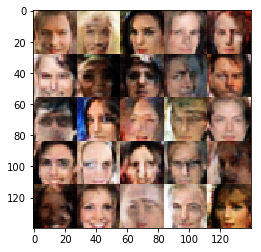

07/23/17 17:42:00  Epoch: 1/2  Step: 2960  Generator Loss: 2.80  Discriminator Loss: 0.84 
07/23/17 17:42:01  Epoch: 1/2  Step: 2970  Generator Loss: 0.64  Discriminator Loss: 0.99 
07/23/17 17:42:02  Epoch: 1/2  Step: 2980  Generator Loss: 0.32  Discriminator Loss: 1.55 
07/23/17 17:42:03  Epoch: 1/2  Step: 2990  Generator Loss: 1.08  Discriminator Loss: 0.70 
07/23/17 17:42:04  Epoch: 1/2  Step: 3000  Generator Loss: 2.12  Discriminator Loss: 0.62 


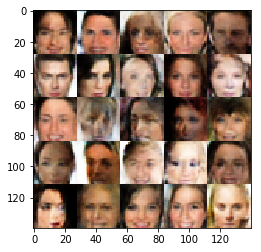

07/23/17 17:42:05  Epoch: 1/2  Step: 3010  Generator Loss: 0.49  Discriminator Loss: 1.24 
07/23/17 17:42:06  Epoch: 1/2  Step: 3020  Generator Loss: 1.35  Discriminator Loss: 0.51 
07/23/17 17:42:07  Epoch: 1/2  Step: 3030  Generator Loss: 1.20  Discriminator Loss: 0.64 
07/23/17 17:42:08  Epoch: 1/2  Step: 3040  Generator Loss: 0.65  Discriminator Loss: 0.95 
07/23/17 17:42:09  Epoch: 1/2  Step: 3050  Generator Loss: 0.16  Discriminator Loss: 2.07 


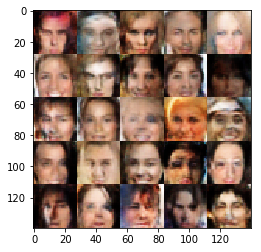

07/23/17 17:42:10  Epoch: 1/2  Step: 3060  Generator Loss: 2.22  Discriminator Loss: 0.47 
07/23/17 17:42:11  Epoch: 1/2  Step: 3070  Generator Loss: 1.55  Discriminator Loss: 1.14 
07/23/17 17:42:12  Epoch: 1/2  Step: 3080  Generator Loss: 0.27  Discriminator Loss: 1.71 
07/23/17 17:42:13  Epoch: 1/2  Step: 3090  Generator Loss: 1.74  Discriminator Loss: 0.41 
07/23/17 17:42:14  Epoch: 1/2  Step: 3100  Generator Loss: 0.61  Discriminator Loss: 0.93 


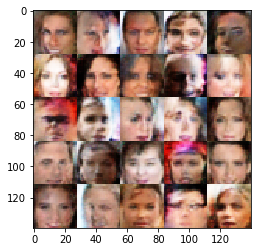

07/23/17 17:42:15  Epoch: 1/2  Step: 3110  Generator Loss: 1.93  Discriminator Loss: 0.47 
07/23/17 17:42:16  Epoch: 1/2  Step: 3120  Generator Loss: 1.21  Discriminator Loss: 0.59 
07/23/17 17:42:17  Epoch: 1/2  Step: 3130  Generator Loss: 1.21  Discriminator Loss: 0.54 
07/23/17 17:42:18  Epoch: 1/2  Step: 3140  Generator Loss: 1.38  Discriminator Loss: 0.46 
07/23/17 17:42:19  Epoch: 1/2  Step: 3150  Generator Loss: 1.18  Discriminator Loss: 0.97 


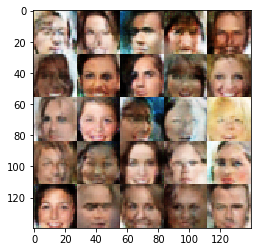

07/23/17 17:42:20  Epoch: 1/2  Step: 3160  Generator Loss: 1.28  Discriminator Loss: 0.54 
07/23/17 17:42:21  Epoch: 2/2  Step: 3170  Generator Loss: 0.43  Discriminator Loss: 1.38 
07/23/17 17:42:22  Epoch: 2/2  Step: 3180  Generator Loss: 0.77  Discriminator Loss: 0.87 
07/23/17 17:42:23  Epoch: 2/2  Step: 3190  Generator Loss: 1.52  Discriminator Loss: 0.50 
07/23/17 17:42:24  Epoch: 2/2  Step: 3200  Generator Loss: 1.52  Discriminator Loss: 0.61 


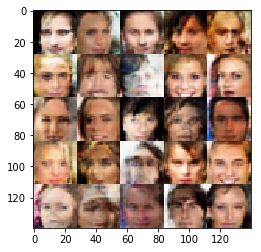

07/23/17 17:42:25  Epoch: 2/2  Step: 3210  Generator Loss: 1.79  Discriminator Loss: 0.47 
07/23/17 17:42:26  Epoch: 2/2  Step: 3220  Generator Loss: 2.15  Discriminator Loss: 0.63 
07/23/17 17:42:27  Epoch: 2/2  Step: 3230  Generator Loss: 3.16  Discriminator Loss: 0.34 
07/23/17 17:42:28  Epoch: 2/2  Step: 3240  Generator Loss: 1.18  Discriminator Loss: 0.71 
07/23/17 17:42:28  Epoch: 2/2  Step: 3250  Generator Loss: 0.74  Discriminator Loss: 0.90 


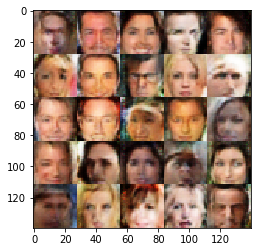

07/23/17 17:42:30  Epoch: 2/2  Step: 3260  Generator Loss: 5.06  Discriminator Loss: 0.27 
07/23/17 17:42:31  Epoch: 2/2  Step: 3270  Generator Loss: 1.30  Discriminator Loss: 0.55 
07/23/17 17:42:32  Epoch: 2/2  Step: 3280  Generator Loss: 2.17  Discriminator Loss: 0.32 
07/23/17 17:42:32  Epoch: 2/2  Step: 3290  Generator Loss: 0.88  Discriminator Loss: 0.71 
07/23/17 17:42:33  Epoch: 2/2  Step: 3300  Generator Loss: 1.81  Discriminator Loss: 0.69 


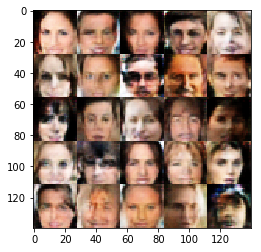

07/23/17 17:42:35  Epoch: 2/2  Step: 3310  Generator Loss: 5.25  Discriminator Loss: 0.44 
07/23/17 17:42:36  Epoch: 2/2  Step: 3320  Generator Loss: 1.20  Discriminator Loss: 0.65 
07/23/17 17:42:36  Epoch: 2/2  Step: 3330  Generator Loss: 0.51  Discriminator Loss: 1.16 
07/23/17 17:42:37  Epoch: 2/2  Step: 3340  Generator Loss: 1.21  Discriminator Loss: 0.56 
07/23/17 17:42:38  Epoch: 2/2  Step: 3350  Generator Loss: 0.93  Discriminator Loss: 0.76 


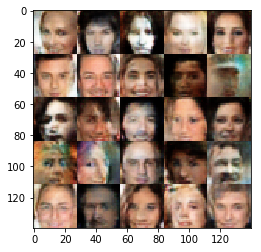

07/23/17 17:42:40  Epoch: 2/2  Step: 3360  Generator Loss: 2.09  Discriminator Loss: 0.42 
07/23/17 17:42:40  Epoch: 2/2  Step: 3370  Generator Loss: 3.10  Discriminator Loss: 0.34 
07/23/17 17:42:41  Epoch: 2/2  Step: 3380  Generator Loss: 0.74  Discriminator Loss: 0.93 
07/23/17 17:42:42  Epoch: 2/2  Step: 3390  Generator Loss: 1.19  Discriminator Loss: 0.91 
07/23/17 17:42:43  Epoch: 2/2  Step: 3400  Generator Loss: 0.88  Discriminator Loss: 0.75 


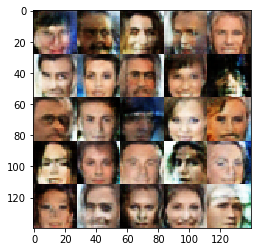

07/23/17 17:42:45  Epoch: 2/2  Step: 3410  Generator Loss: 0.54  Discriminator Loss: 1.16 
07/23/17 17:42:45  Epoch: 2/2  Step: 3420  Generator Loss: 0.52  Discriminator Loss: 1.10 
07/23/17 17:42:46  Epoch: 2/2  Step: 3430  Generator Loss: 2.58  Discriminator Loss: 0.29 
07/23/17 17:42:47  Epoch: 2/2  Step: 3440  Generator Loss: 1.99  Discriminator Loss: 0.33 
07/23/17 17:42:48  Epoch: 2/2  Step: 3450  Generator Loss: 0.47  Discriminator Loss: 1.25 


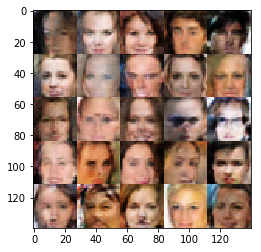

07/23/17 17:42:49  Epoch: 2/2  Step: 3460  Generator Loss: 0.74  Discriminator Loss: 0.84 
07/23/17 17:42:50  Epoch: 2/2  Step: 3470  Generator Loss: 0.53  Discriminator Loss: 1.12 
07/23/17 17:42:51  Epoch: 2/2  Step: 3480  Generator Loss: 0.35  Discriminator Loss: 1.57 
07/23/17 17:42:52  Epoch: 2/2  Step: 3490  Generator Loss: 1.06  Discriminator Loss: 0.74 
07/23/17 17:42:53  Epoch: 2/2  Step: 3500  Generator Loss: 0.35  Discriminator Loss: 1.53 


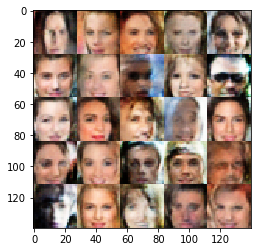

07/23/17 17:42:54  Epoch: 2/2  Step: 3510  Generator Loss: 0.55  Discriminator Loss: 1.22 
07/23/17 17:42:55  Epoch: 2/2  Step: 3520  Generator Loss: 3.28  Discriminator Loss: 0.20 
07/23/17 17:42:56  Epoch: 2/2  Step: 3530  Generator Loss: 1.83  Discriminator Loss: 0.36 
07/23/17 17:42:57  Epoch: 2/2  Step: 3540  Generator Loss: 0.57  Discriminator Loss: 1.04 
07/23/17 17:42:58  Epoch: 2/2  Step: 3550  Generator Loss: 2.02  Discriminator Loss: 0.85 


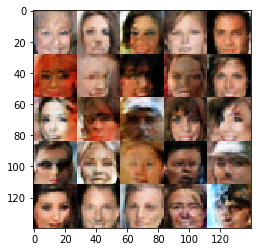

07/23/17 17:42:59  Epoch: 2/2  Step: 3560  Generator Loss: 0.91  Discriminator Loss: 0.72 
07/23/17 17:43:00  Epoch: 2/2  Step: 3570  Generator Loss: 0.99  Discriminator Loss: 0.71 
07/23/17 17:43:01  Epoch: 2/2  Step: 3580  Generator Loss: 0.77  Discriminator Loss: 1.05 
07/23/17 17:43:02  Epoch: 2/2  Step: 3590  Generator Loss: 0.94  Discriminator Loss: 0.93 
07/23/17 17:43:03  Epoch: 2/2  Step: 3600  Generator Loss: 1.44  Discriminator Loss: 0.58 


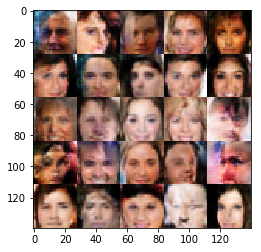

07/23/17 17:43:04  Epoch: 2/2  Step: 3610  Generator Loss: 2.68  Discriminator Loss: 0.30 
07/23/17 17:43:05  Epoch: 2/2  Step: 3620  Generator Loss: 1.34  Discriminator Loss: 0.47 
07/23/17 17:43:06  Epoch: 2/2  Step: 3630  Generator Loss: 1.25  Discriminator Loss: 0.55 
07/23/17 17:43:07  Epoch: 2/2  Step: 3640  Generator Loss: 0.22  Discriminator Loss: 1.94 
07/23/17 17:43:08  Epoch: 2/2  Step: 3650  Generator Loss: 0.67  Discriminator Loss: 0.97 


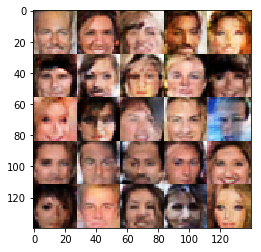

07/23/17 17:43:09  Epoch: 2/2  Step: 3660  Generator Loss: 0.67  Discriminator Loss: 0.98 
07/23/17 17:43:10  Epoch: 2/2  Step: 3670  Generator Loss: 1.81  Discriminator Loss: 0.66 
07/23/17 17:43:11  Epoch: 2/2  Step: 3680  Generator Loss: 2.05  Discriminator Loss: 0.50 
07/23/17 17:43:12  Epoch: 2/2  Step: 3690  Generator Loss: 1.73  Discriminator Loss: 1.24 
07/23/17 17:43:13  Epoch: 2/2  Step: 3700  Generator Loss: 5.40  Discriminator Loss: 0.86 


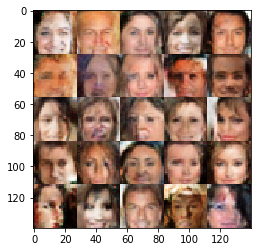

07/23/17 17:43:14  Epoch: 2/2  Step: 3710  Generator Loss: 1.90  Discriminator Loss: 0.84 
07/23/17 17:43:15  Epoch: 2/2  Step: 3720  Generator Loss: 1.32  Discriminator Loss: 0.64 
07/23/17 17:43:16  Epoch: 2/2  Step: 3730  Generator Loss: 0.79  Discriminator Loss: 0.82 
07/23/17 17:43:17  Epoch: 2/2  Step: 3740  Generator Loss: 0.85  Discriminator Loss: 0.72 
07/23/17 17:43:18  Epoch: 2/2  Step: 3750  Generator Loss: 1.96  Discriminator Loss: 0.46 


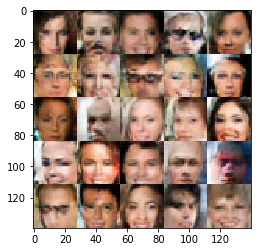

07/23/17 17:43:19  Epoch: 2/2  Step: 3760  Generator Loss: 2.05  Discriminator Loss: 0.68 
07/23/17 17:43:20  Epoch: 2/2  Step: 3770  Generator Loss: 0.49  Discriminator Loss: 1.19 
07/23/17 17:43:21  Epoch: 2/2  Step: 3780  Generator Loss: 0.44  Discriminator Loss: 1.26 
07/23/17 17:43:22  Epoch: 2/2  Step: 3790  Generator Loss: 0.72  Discriminator Loss: 0.91 
07/23/17 17:43:23  Epoch: 2/2  Step: 3800  Generator Loss: 0.63  Discriminator Loss: 0.98 


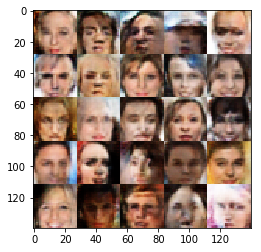

07/23/17 17:43:24  Epoch: 2/2  Step: 3810  Generator Loss: 2.19  Discriminator Loss: 1.09 
07/23/17 17:43:25  Epoch: 2/2  Step: 3820  Generator Loss: 1.24  Discriminator Loss: 0.59 
07/23/17 17:43:26  Epoch: 2/2  Step: 3830  Generator Loss: 0.48  Discriminator Loss: 1.20 
07/23/17 17:43:27  Epoch: 2/2  Step: 3840  Generator Loss: 0.47  Discriminator Loss: 1.30 
07/23/17 17:43:28  Epoch: 2/2  Step: 3850  Generator Loss: 1.22  Discriminator Loss: 0.63 


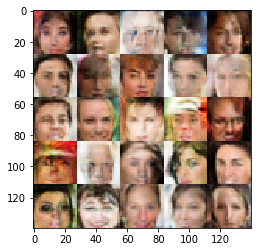

07/23/17 17:43:29  Epoch: 2/2  Step: 3860  Generator Loss: 1.45  Discriminator Loss: 0.46 
07/23/17 17:43:30  Epoch: 2/2  Step: 3870  Generator Loss: 0.35  Discriminator Loss: 1.57 
07/23/17 17:43:31  Epoch: 2/2  Step: 3880  Generator Loss: 3.44  Discriminator Loss: 0.90 
07/23/17 17:43:32  Epoch: 2/2  Step: 3890  Generator Loss: 0.77  Discriminator Loss: 1.06 
07/23/17 17:43:33  Epoch: 2/2  Step: 3900  Generator Loss: 1.63  Discriminator Loss: 0.41 


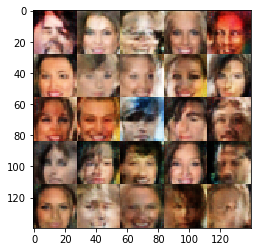

07/23/17 17:43:34  Epoch: 2/2  Step: 3910  Generator Loss: 1.65  Discriminator Loss: 0.51 
07/23/17 17:43:35  Epoch: 2/2  Step: 3920  Generator Loss: 2.80  Discriminator Loss: 0.87 
07/23/17 17:43:36  Epoch: 2/2  Step: 3930  Generator Loss: 1.60  Discriminator Loss: 0.85 
07/23/17 17:43:37  Epoch: 2/2  Step: 3940  Generator Loss: 0.23  Discriminator Loss: 1.95 
07/23/17 17:43:38  Epoch: 2/2  Step: 3950  Generator Loss: 1.16  Discriminator Loss: 0.57 


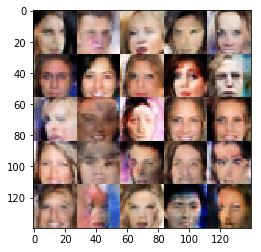

07/23/17 17:43:39  Epoch: 2/2  Step: 3960  Generator Loss: 1.36  Discriminator Loss: 1.04 
07/23/17 17:43:40  Epoch: 2/2  Step: 3970  Generator Loss: 0.58  Discriminator Loss: 1.18 
07/23/17 17:43:41  Epoch: 2/2  Step: 3980  Generator Loss: 3.14  Discriminator Loss: 0.87 
07/23/17 17:43:42  Epoch: 2/2  Step: 3990  Generator Loss: 1.25  Discriminator Loss: 0.63 
07/23/17 17:43:43  Epoch: 2/2  Step: 4000  Generator Loss: 1.01  Discriminator Loss: 0.62 


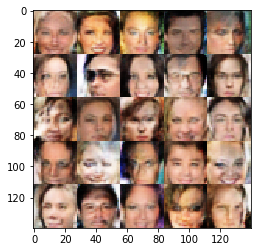

07/23/17 17:43:44  Epoch: 2/2  Step: 4010  Generator Loss: 1.89  Discriminator Loss: 0.41 
07/23/17 17:43:45  Epoch: 2/2  Step: 4020  Generator Loss: 3.18  Discriminator Loss: 0.14 
07/23/17 17:43:46  Epoch: 2/2  Step: 4030  Generator Loss: 2.02  Discriminator Loss: 0.79 
07/23/17 17:43:47  Epoch: 2/2  Step: 4040  Generator Loss: 1.19  Discriminator Loss: 0.68 
07/23/17 17:43:48  Epoch: 2/2  Step: 4050  Generator Loss: 1.13  Discriminator Loss: 0.70 


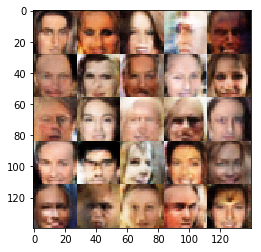

07/23/17 17:43:49  Epoch: 2/2  Step: 4060  Generator Loss: 1.79  Discriminator Loss: 0.54 
07/23/17 17:43:50  Epoch: 2/2  Step: 4070  Generator Loss: 1.49  Discriminator Loss: 0.45 
07/23/17 17:43:51  Epoch: 2/2  Step: 4080  Generator Loss: 0.56  Discriminator Loss: 1.15 
07/23/17 17:43:52  Epoch: 2/2  Step: 4090  Generator Loss: 0.31  Discriminator Loss: 1.63 
07/23/17 17:43:52  Epoch: 2/2  Step: 4100  Generator Loss: 2.34  Discriminator Loss: 0.28 


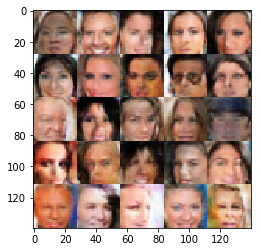

07/23/17 17:43:54  Epoch: 2/2  Step: 4110  Generator Loss: 0.84  Discriminator Loss: 0.81 
07/23/17 17:43:55  Epoch: 2/2  Step: 4120  Generator Loss: 1.97  Discriminator Loss: 0.74 
07/23/17 17:43:56  Epoch: 2/2  Step: 4130  Generator Loss: 1.26  Discriminator Loss: 0.50 
07/23/17 17:43:57  Epoch: 2/2  Step: 4140  Generator Loss: 0.33  Discriminator Loss: 1.57 
07/23/17 17:43:57  Epoch: 2/2  Step: 4150  Generator Loss: 1.19  Discriminator Loss: 0.53 


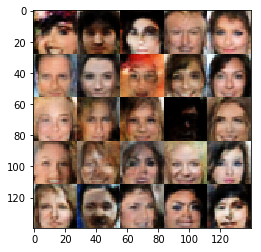

07/23/17 17:43:59  Epoch: 2/2  Step: 4160  Generator Loss: 3.42  Discriminator Loss: 0.18 
07/23/17 17:44:00  Epoch: 2/2  Step: 4170  Generator Loss: 2.28  Discriminator Loss: 0.36 
07/23/17 17:44:01  Epoch: 2/2  Step: 4180  Generator Loss: 1.19  Discriminator Loss: 0.50 
07/23/17 17:44:02  Epoch: 2/2  Step: 4190  Generator Loss: 1.99  Discriminator Loss: 1.01 
07/23/17 17:44:02  Epoch: 2/2  Step: 4200  Generator Loss: 2.19  Discriminator Loss: 0.38 


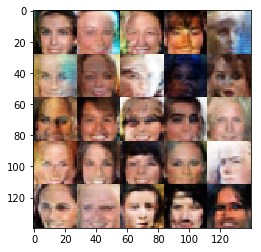

07/23/17 17:44:04  Epoch: 2/2  Step: 4210  Generator Loss: 0.61  Discriminator Loss: 1.00 
07/23/17 17:44:05  Epoch: 2/2  Step: 4220  Generator Loss: 0.47  Discriminator Loss: 1.30 
07/23/17 17:44:06  Epoch: 2/2  Step: 4230  Generator Loss: 0.47  Discriminator Loss: 1.25 
07/23/17 17:44:06  Epoch: 2/2  Step: 4240  Generator Loss: 1.42  Discriminator Loss: 0.46 
07/23/17 17:44:07  Epoch: 2/2  Step: 4250  Generator Loss: 1.80  Discriminator Loss: 0.59 


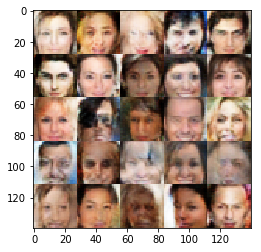

07/23/17 17:44:09  Epoch: 2/2  Step: 4260  Generator Loss: 3.00  Discriminator Loss: 0.76 
07/23/17 17:44:10  Epoch: 2/2  Step: 4270  Generator Loss: 0.41  Discriminator Loss: 1.40 
07/23/17 17:44:11  Epoch: 2/2  Step: 4280  Generator Loss: 0.38  Discriminator Loss: 1.60 
07/23/17 17:44:11  Epoch: 2/2  Step: 4290  Generator Loss: 0.48  Discriminator Loss: 1.25 
07/23/17 17:44:12  Epoch: 2/2  Step: 4300  Generator Loss: 1.68  Discriminator Loss: 0.79 


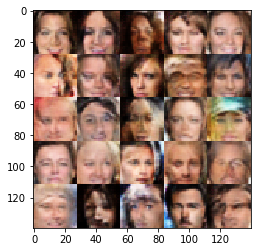

07/23/17 17:44:14  Epoch: 2/2  Step: 4310  Generator Loss: 4.84  Discriminator Loss: 0.25 
07/23/17 17:44:15  Epoch: 2/2  Step: 4320  Generator Loss: 0.29  Discriminator Loss: 1.67 
07/23/17 17:44:16  Epoch: 2/2  Step: 4330  Generator Loss: 2.02  Discriminator Loss: 0.48 
07/23/17 17:44:16  Epoch: 2/2  Step: 4340  Generator Loss: 1.38  Discriminator Loss: 0.43 
07/23/17 17:44:17  Epoch: 2/2  Step: 4350  Generator Loss: 1.38  Discriminator Loss: 0.71 


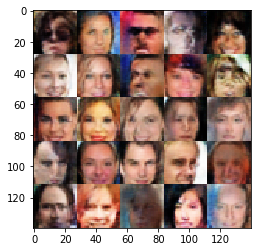

07/23/17 17:44:19  Epoch: 2/2  Step: 4360  Generator Loss: 0.50  Discriminator Loss: 1.24 
07/23/17 17:44:20  Epoch: 2/2  Step: 4370  Generator Loss: 3.10  Discriminator Loss: 0.23 
07/23/17 17:44:21  Epoch: 2/2  Step: 4380  Generator Loss: 3.20  Discriminator Loss: 0.39 
07/23/17 17:44:22  Epoch: 2/2  Step: 4390  Generator Loss: 1.75  Discriminator Loss: 0.36 
07/23/17 17:44:22  Epoch: 2/2  Step: 4400  Generator Loss: 1.86  Discriminator Loss: 0.47 


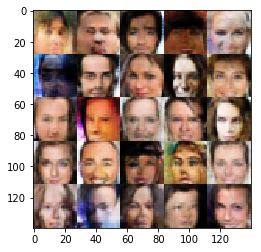

07/23/17 17:44:24  Epoch: 2/2  Step: 4410  Generator Loss: 2.25  Discriminator Loss: 0.25 
07/23/17 17:44:25  Epoch: 2/2  Step: 4420  Generator Loss: 3.14  Discriminator Loss: 0.71 
07/23/17 17:44:26  Epoch: 2/2  Step: 4430  Generator Loss: 0.63  Discriminator Loss: 0.99 
07/23/17 17:44:27  Epoch: 2/2  Step: 4440  Generator Loss: 0.17  Discriminator Loss: 2.38 
07/23/17 17:44:27  Epoch: 2/2  Step: 4450  Generator Loss: 0.21  Discriminator Loss: 1.95 


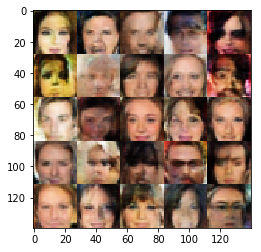

07/23/17 17:44:29  Epoch: 2/2  Step: 4460  Generator Loss: 3.09  Discriminator Loss: 0.51 
07/23/17 17:44:30  Epoch: 2/2  Step: 4470  Generator Loss: 0.46  Discriminator Loss: 1.36 
07/23/17 17:44:31  Epoch: 2/2  Step: 4480  Generator Loss: 1.60  Discriminator Loss: 0.46 
07/23/17 17:44:32  Epoch: 2/2  Step: 4490  Generator Loss: 1.35  Discriminator Loss: 0.74 
07/23/17 17:44:32  Epoch: 2/2  Step: 4500  Generator Loss: 0.72  Discriminator Loss: 0.92 


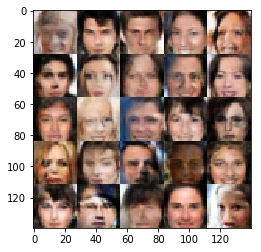

07/23/17 17:44:34  Epoch: 2/2  Step: 4510  Generator Loss: 0.87  Discriminator Loss: 0.75 
07/23/17 17:44:35  Epoch: 2/2  Step: 4520  Generator Loss: 2.07  Discriminator Loss: 0.42 
07/23/17 17:44:36  Epoch: 2/2  Step: 4530  Generator Loss: 1.65  Discriminator Loss: 0.46 
07/23/17 17:44:37  Epoch: 2/2  Step: 4540  Generator Loss: 1.25  Discriminator Loss: 0.83 
07/23/17 17:44:37  Epoch: 2/2  Step: 4550  Generator Loss: 2.31  Discriminator Loss: 0.70 


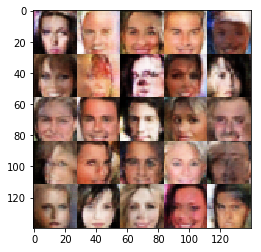

07/23/17 17:44:39  Epoch: 2/2  Step: 4560  Generator Loss: 0.80  Discriminator Loss: 0.84 
07/23/17 17:44:40  Epoch: 2/2  Step: 4570  Generator Loss: 2.49  Discriminator Loss: 1.03 
07/23/17 17:44:41  Epoch: 2/2  Step: 4580  Generator Loss: 4.63  Discriminator Loss: 0.18 
07/23/17 17:44:42  Epoch: 2/2  Step: 4590  Generator Loss: 1.32  Discriminator Loss: 0.62 
07/23/17 17:44:42  Epoch: 2/2  Step: 4600  Generator Loss: 0.56  Discriminator Loss: 1.03 


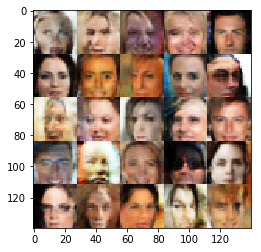

07/23/17 17:44:44  Epoch: 2/2  Step: 4610  Generator Loss: 2.44  Discriminator Loss: 0.55 
07/23/17 17:44:45  Epoch: 2/2  Step: 4620  Generator Loss: 0.55  Discriminator Loss: 1.12 
07/23/17 17:44:46  Epoch: 2/2  Step: 4630  Generator Loss: 1.27  Discriminator Loss: 0.51 
07/23/17 17:44:47  Epoch: 2/2  Step: 4640  Generator Loss: 2.73  Discriminator Loss: 0.98 
07/23/17 17:44:47  Epoch: 2/2  Step: 4650  Generator Loss: 0.75  Discriminator Loss: 0.96 


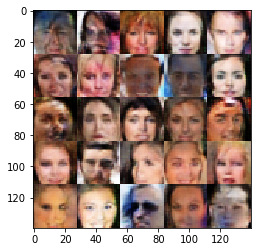

07/23/17 17:44:49  Epoch: 2/2  Step: 4660  Generator Loss: 1.41  Discriminator Loss: 0.49 
07/23/17 17:44:50  Epoch: 2/2  Step: 4670  Generator Loss: 0.42  Discriminator Loss: 1.32 
07/23/17 17:44:51  Epoch: 2/2  Step: 4680  Generator Loss: 1.69  Discriminator Loss: 0.40 
07/23/17 17:44:52  Epoch: 2/2  Step: 4690  Generator Loss: 3.15  Discriminator Loss: 0.85 
07/23/17 17:44:52  Epoch: 2/2  Step: 4700  Generator Loss: 1.33  Discriminator Loss: 0.53 


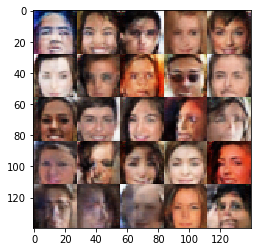

07/23/17 17:44:54  Epoch: 2/2  Step: 4710  Generator Loss: 0.23  Discriminator Loss: 1.88 
07/23/17 17:44:55  Epoch: 2/2  Step: 4720  Generator Loss: 1.44  Discriminator Loss: 0.46 
07/23/17 17:44:56  Epoch: 2/2  Step: 4730  Generator Loss: 1.95  Discriminator Loss: 0.35 
07/23/17 17:44:56  Epoch: 2/2  Step: 4740  Generator Loss: 2.60  Discriminator Loss: 0.24 
07/23/17 17:44:57  Epoch: 2/2  Step: 4750  Generator Loss: 0.69  Discriminator Loss: 0.99 


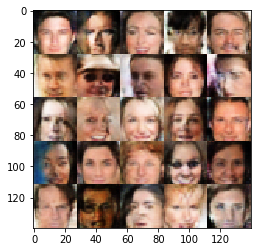

07/23/17 17:44:59  Epoch: 2/2  Step: 4760  Generator Loss: 0.99  Discriminator Loss: 0.66 
07/23/17 17:45:00  Epoch: 2/2  Step: 4770  Generator Loss: 0.36  Discriminator Loss: 1.48 
07/23/17 17:45:01  Epoch: 2/2  Step: 4780  Generator Loss: 1.86  Discriminator Loss: 0.32 
07/23/17 17:45:01  Epoch: 2/2  Step: 4790  Generator Loss: 0.30  Discriminator Loss: 1.79 
07/23/17 17:45:02  Epoch: 2/2  Step: 4800  Generator Loss: 2.57  Discriminator Loss: 0.19 


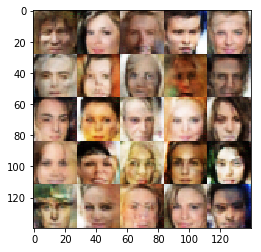

07/23/17 17:45:04  Epoch: 2/2  Step: 4810  Generator Loss: 1.95  Discriminator Loss: 0.42 
07/23/17 17:45:05  Epoch: 2/2  Step: 4820  Generator Loss: 0.59  Discriminator Loss: 1.13 
07/23/17 17:45:06  Epoch: 2/2  Step: 4830  Generator Loss: 0.76  Discriminator Loss: 0.97 
07/23/17 17:45:06  Epoch: 2/2  Step: 4840  Generator Loss: 0.65  Discriminator Loss: 1.09 
07/23/17 17:45:07  Epoch: 2/2  Step: 4850  Generator Loss: 0.96  Discriminator Loss: 0.73 


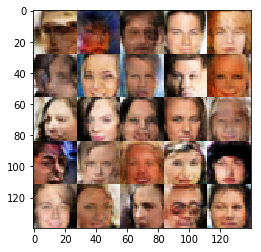

07/23/17 17:45:09  Epoch: 2/2  Step: 4860  Generator Loss: 0.90  Discriminator Loss: 0.74 
07/23/17 17:45:10  Epoch: 2/2  Step: 4870  Generator Loss: 1.59  Discriminator Loss: 0.38 
07/23/17 17:45:11  Epoch: 2/2  Step: 4880  Generator Loss: 0.50  Discriminator Loss: 1.19 
07/23/17 17:45:11  Epoch: 2/2  Step: 4890  Generator Loss: 1.64  Discriminator Loss: 0.48 
07/23/17 17:45:12  Epoch: 2/2  Step: 4900  Generator Loss: 1.56  Discriminator Loss: 0.65 


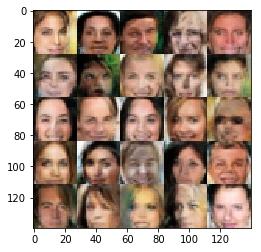

07/23/17 17:45:14  Epoch: 2/2  Step: 4910  Generator Loss: 0.79  Discriminator Loss: 0.98 
07/23/17 17:45:15  Epoch: 2/2  Step: 4920  Generator Loss: 1.97  Discriminator Loss: 0.35 
07/23/17 17:45:16  Epoch: 2/2  Step: 4930  Generator Loss: 2.61  Discriminator Loss: 0.55 
07/23/17 17:45:16  Epoch: 2/2  Step: 4940  Generator Loss: 2.85  Discriminator Loss: 0.61 
07/23/17 17:45:17  Epoch: 2/2  Step: 4950  Generator Loss: 0.42  Discriminator Loss: 1.45 


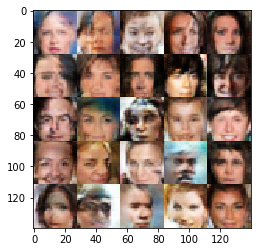

07/23/17 17:45:19  Epoch: 2/2  Step: 4960  Generator Loss: 0.22  Discriminator Loss: 2.04 
07/23/17 17:45:20  Epoch: 2/2  Step: 4970  Generator Loss: 0.71  Discriminator Loss: 1.07 
07/23/17 17:45:21  Epoch: 2/2  Step: 4980  Generator Loss: 1.41  Discriminator Loss: 0.58 
07/23/17 17:45:21  Epoch: 2/2  Step: 4990  Generator Loss: 0.43  Discriminator Loss: 1.36 
07/23/17 17:45:22  Epoch: 2/2  Step: 5000  Generator Loss: 1.14  Discriminator Loss: 0.57 


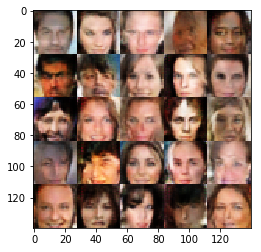

07/23/17 17:45:24  Epoch: 2/2  Step: 5010  Generator Loss: 0.90  Discriminator Loss: 0.69 
07/23/17 17:45:25  Epoch: 2/2  Step: 5020  Generator Loss: 1.91  Discriminator Loss: 0.40 
07/23/17 17:45:26  Epoch: 2/2  Step: 5030  Generator Loss: 1.07  Discriminator Loss: 0.57 
07/23/17 17:45:26  Epoch: 2/2  Step: 5040  Generator Loss: 1.10  Discriminator Loss: 0.72 
07/23/17 17:45:27  Epoch: 2/2  Step: 5050  Generator Loss: 3.02  Discriminator Loss: 0.28 


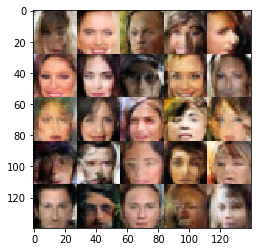

07/23/17 17:45:29  Epoch: 2/2  Step: 5060  Generator Loss: 0.15  Discriminator Loss: 2.22 
07/23/17 17:45:30  Epoch: 2/2  Step: 5070  Generator Loss: 0.50  Discriminator Loss: 1.22 
07/23/17 17:45:31  Epoch: 2/2  Step: 5080  Generator Loss: 3.49  Discriminator Loss: 0.30 
07/23/17 17:45:31  Epoch: 2/2  Step: 5090  Generator Loss: 1.43  Discriminator Loss: 0.54 
07/23/17 17:45:32  Epoch: 2/2  Step: 5100  Generator Loss: 2.18  Discriminator Loss: 0.49 


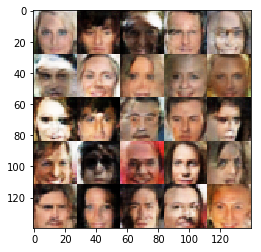

07/23/17 17:45:34  Epoch: 2/2  Step: 5110  Generator Loss: 1.28  Discriminator Loss: 0.54 
07/23/17 17:45:35  Epoch: 2/2  Step: 5120  Generator Loss: 0.32  Discriminator Loss: 1.55 
07/23/17 17:45:36  Epoch: 2/2  Step: 5130  Generator Loss: 1.33  Discriminator Loss: 0.71 
07/23/17 17:45:36  Epoch: 2/2  Step: 5140  Generator Loss: 0.85  Discriminator Loss: 0.81 
07/23/17 17:45:37  Epoch: 2/2  Step: 5150  Generator Loss: 1.69  Discriminator Loss: 1.00 


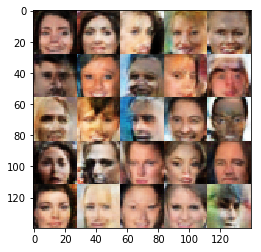

07/23/17 17:45:39  Epoch: 2/2  Step: 5160  Generator Loss: 1.69  Discriminator Loss: 0.40 
07/23/17 17:45:40  Epoch: 2/2  Step: 5170  Generator Loss: 1.61  Discriminator Loss: 0.49 
07/23/17 17:45:41  Epoch: 2/2  Step: 5180  Generator Loss: 1.69  Discriminator Loss: 0.60 
07/23/17 17:45:41  Epoch: 2/2  Step: 5190  Generator Loss: 0.48  Discriminator Loss: 1.26 
07/23/17 17:45:42  Epoch: 2/2  Step: 5200  Generator Loss: 0.92  Discriminator Loss: 0.71 


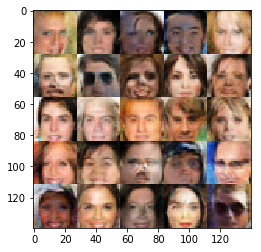

07/23/17 17:45:44  Epoch: 2/2  Step: 5210  Generator Loss: 1.53  Discriminator Loss: 0.39 
07/23/17 17:45:45  Epoch: 2/2  Step: 5220  Generator Loss: 1.38  Discriminator Loss: 0.46 
07/23/17 17:45:46  Epoch: 2/2  Step: 5230  Generator Loss: 1.13  Discriminator Loss: 0.57 
07/23/17 17:45:46  Epoch: 2/2  Step: 5240  Generator Loss: 1.32  Discriminator Loss: 0.80 
07/23/17 17:45:47  Epoch: 2/2  Step: 5250  Generator Loss: 1.17  Discriminator Loss: 0.59 


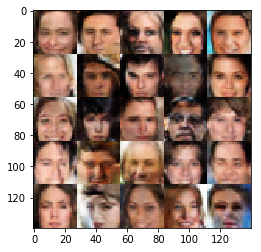

07/23/17 17:45:49  Epoch: 2/2  Step: 5260  Generator Loss: 0.33  Discriminator Loss: 1.68 
07/23/17 17:45:50  Epoch: 2/2  Step: 5270  Generator Loss: 0.79  Discriminator Loss: 0.82 
07/23/17 17:45:51  Epoch: 2/2  Step: 5280  Generator Loss: 1.20  Discriminator Loss: 0.62 
07/23/17 17:45:52  Epoch: 2/2  Step: 5290  Generator Loss: 1.96  Discriminator Loss: 0.36 
07/23/17 17:45:53  Epoch: 2/2  Step: 5300  Generator Loss: 0.50  Discriminator Loss: 1.24 


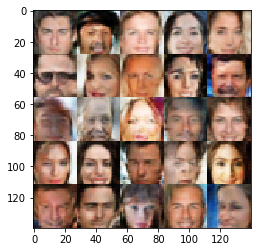

07/23/17 17:45:54  Epoch: 2/2  Step: 5310  Generator Loss: 0.56  Discriminator Loss: 1.18 
07/23/17 17:45:55  Epoch: 2/2  Step: 5320  Generator Loss: 0.33  Discriminator Loss: 1.68 
07/23/17 17:45:56  Epoch: 2/2  Step: 5330  Generator Loss: 0.42  Discriminator Loss: 1.40 
07/23/17 17:45:57  Epoch: 2/2  Step: 5340  Generator Loss: 1.61  Discriminator Loss: 0.39 
07/23/17 17:45:58  Epoch: 2/2  Step: 5350  Generator Loss: 1.64  Discriminator Loss: 0.61 


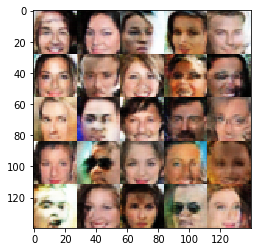

07/23/17 17:45:59  Epoch: 2/2  Step: 5360  Generator Loss: 1.87  Discriminator Loss: 0.43 
07/23/17 17:46:00  Epoch: 2/2  Step: 5370  Generator Loss: 1.49  Discriminator Loss: 0.45 
07/23/17 17:46:01  Epoch: 2/2  Step: 5380  Generator Loss: 0.54  Discriminator Loss: 1.16 
07/23/17 17:46:02  Epoch: 2/2  Step: 5390  Generator Loss: 1.55  Discriminator Loss: 0.40 
07/23/17 17:46:03  Epoch: 2/2  Step: 5400  Generator Loss: 0.49  Discriminator Loss: 1.19 


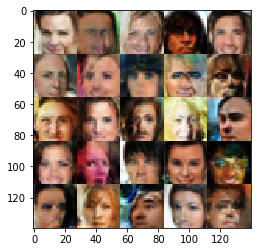

07/23/17 17:46:04  Epoch: 2/2  Step: 5410  Generator Loss: 1.63  Discriminator Loss: 0.42 
07/23/17 17:46:05  Epoch: 2/2  Step: 5420  Generator Loss: 0.75  Discriminator Loss: 0.95 
07/23/17 17:46:06  Epoch: 2/2  Step: 5430  Generator Loss: 1.49  Discriminator Loss: 0.49 
07/23/17 17:46:07  Epoch: 2/2  Step: 5440  Generator Loss: 0.81  Discriminator Loss: 0.82 
07/23/17 17:46:08  Epoch: 2/2  Step: 5450  Generator Loss: 1.38  Discriminator Loss: 0.67 


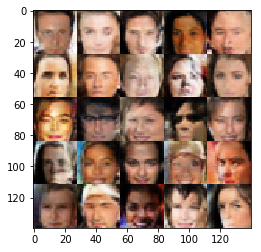

07/23/17 17:46:09  Epoch: 2/2  Step: 5460  Generator Loss: 2.96  Discriminator Loss: 1.01 
07/23/17 17:46:10  Epoch: 2/2  Step: 5470  Generator Loss: 0.55  Discriminator Loss: 1.19 
07/23/17 17:46:11  Epoch: 2/2  Step: 5480  Generator Loss: 0.37  Discriminator Loss: 1.52 
07/23/17 17:46:12  Epoch: 2/2  Step: 5490  Generator Loss: 0.24  Discriminator Loss: 1.81 
07/23/17 17:46:13  Epoch: 2/2  Step: 5500  Generator Loss: 1.39  Discriminator Loss: 0.52 


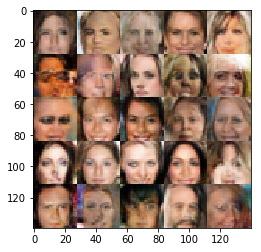

07/23/17 17:46:14  Epoch: 2/2  Step: 5510  Generator Loss: 0.47  Discriminator Loss: 1.19 
07/23/17 17:46:15  Epoch: 2/2  Step: 5520  Generator Loss: 1.10  Discriminator Loss: 0.78 
07/23/17 17:46:16  Epoch: 2/2  Step: 5530  Generator Loss: 0.84  Discriminator Loss: 0.80 
07/23/17 17:46:17  Epoch: 2/2  Step: 5540  Generator Loss: 1.25  Discriminator Loss: 0.60 
07/23/17 17:46:18  Epoch: 2/2  Step: 5550  Generator Loss: 0.72  Discriminator Loss: 0.94 


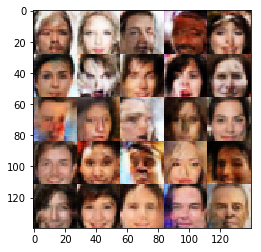

07/23/17 17:46:19  Epoch: 2/2  Step: 5560  Generator Loss: 2.58  Discriminator Loss: 0.19 
07/23/17 17:46:20  Epoch: 2/2  Step: 5570  Generator Loss: 1.65  Discriminator Loss: 0.39 
07/23/17 17:46:21  Epoch: 2/2  Step: 5580  Generator Loss: 0.67  Discriminator Loss: 0.97 
07/23/17 17:46:22  Epoch: 2/2  Step: 5590  Generator Loss: 0.49  Discriminator Loss: 1.17 
07/23/17 17:46:23  Epoch: 2/2  Step: 5600  Generator Loss: 0.48  Discriminator Loss: 1.31 


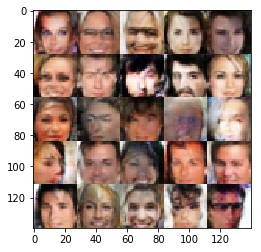

07/23/17 17:46:24  Epoch: 2/2  Step: 5610  Generator Loss: 1.82  Discriminator Loss: 0.43 
07/23/17 17:46:25  Epoch: 2/2  Step: 5620  Generator Loss: 1.51  Discriminator Loss: 0.42 
07/23/17 17:46:26  Epoch: 2/2  Step: 5630  Generator Loss: 0.70  Discriminator Loss: 0.91 
07/23/17 17:46:27  Epoch: 2/2  Step: 5640  Generator Loss: 0.56  Discriminator Loss: 1.14 
07/23/17 17:46:28  Epoch: 2/2  Step: 5650  Generator Loss: 1.98  Discriminator Loss: 0.35 


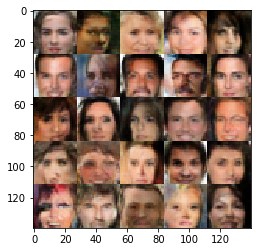

07/23/17 17:46:29  Epoch: 2/2  Step: 5660  Generator Loss: 1.11  Discriminator Loss: 0.83 
07/23/17 17:46:30  Epoch: 2/2  Step: 5670  Generator Loss: 0.66  Discriminator Loss: 1.08 
07/23/17 17:46:31  Epoch: 2/2  Step: 5680  Generator Loss: 0.95  Discriminator Loss: 0.72 
07/23/17 17:46:32  Epoch: 2/2  Step: 5690  Generator Loss: 0.73  Discriminator Loss: 1.04 
07/23/17 17:46:33  Epoch: 2/2  Step: 5700  Generator Loss: 1.43  Discriminator Loss: 0.68 


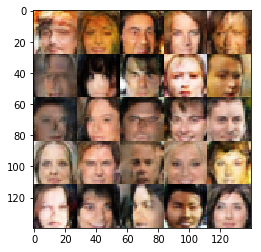

07/23/17 17:46:34  Epoch: 2/2  Step: 5710  Generator Loss: 2.06  Discriminator Loss: 0.54 
07/23/17 17:46:35  Epoch: 2/2  Step: 5720  Generator Loss: 1.04  Discriminator Loss: 0.67 
07/23/17 17:46:36  Epoch: 2/2  Step: 5730  Generator Loss: 2.22  Discriminator Loss: 0.59 
07/23/17 17:46:37  Epoch: 2/2  Step: 5740  Generator Loss: 1.05  Discriminator Loss: 0.71 
07/23/17 17:46:38  Epoch: 2/2  Step: 5750  Generator Loss: 2.69  Discriminator Loss: 0.31 


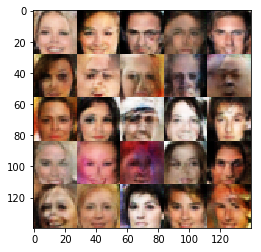

07/23/17 17:46:39  Epoch: 2/2  Step: 5760  Generator Loss: 1.23  Discriminator Loss: 0.71 
07/23/17 17:46:40  Epoch: 2/2  Step: 5770  Generator Loss: 0.55  Discriminator Loss: 1.09 
07/23/17 17:46:41  Epoch: 2/2  Step: 5780  Generator Loss: 0.40  Discriminator Loss: 1.37 
07/23/17 17:46:42  Epoch: 2/2  Step: 5790  Generator Loss: 1.09  Discriminator Loss: 0.65 
07/23/17 17:46:43  Epoch: 2/2  Step: 5800  Generator Loss: 0.30  Discriminator Loss: 1.60 


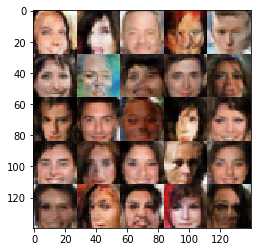

07/23/17 17:46:44  Epoch: 2/2  Step: 5810  Generator Loss: 1.36  Discriminator Loss: 0.55 
07/23/17 17:46:45  Epoch: 2/2  Step: 5820  Generator Loss: 1.93  Discriminator Loss: 0.69 
07/23/17 17:46:46  Epoch: 2/2  Step: 5830  Generator Loss: 2.95  Discriminator Loss: 0.35 
07/23/17 17:46:47  Epoch: 2/2  Step: 5840  Generator Loss: 1.36  Discriminator Loss: 0.55 
07/23/17 17:46:48  Epoch: 2/2  Step: 5850  Generator Loss: 0.19  Discriminator Loss: 2.04 


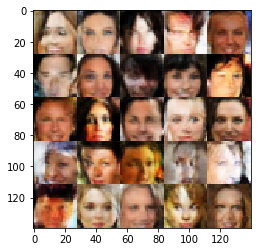

07/23/17 17:46:49  Epoch: 2/2  Step: 5860  Generator Loss: 0.85  Discriminator Loss: 0.82 
07/23/17 17:46:50  Epoch: 2/2  Step: 5870  Generator Loss: 1.33  Discriminator Loss: 0.52 
07/23/17 17:46:51  Epoch: 2/2  Step: 5880  Generator Loss: 1.17  Discriminator Loss: 0.50 
07/23/17 17:46:52  Epoch: 2/2  Step: 5890  Generator Loss: 3.59  Discriminator Loss: 0.62 
07/23/17 17:46:53  Epoch: 2/2  Step: 5900  Generator Loss: 0.44  Discriminator Loss: 1.31 


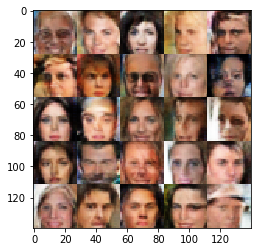

07/23/17 17:46:55  Epoch: 2/2  Step: 5910  Generator Loss: 1.06  Discriminator Loss: 0.92 
07/23/17 17:46:55  Epoch: 2/2  Step: 5920  Generator Loss: 2.17  Discriminator Loss: 0.29 
07/23/17 17:46:56  Epoch: 2/2  Step: 5930  Generator Loss: 1.85  Discriminator Loss: 0.39 
07/23/17 17:46:57  Epoch: 2/2  Step: 5940  Generator Loss: 0.47  Discriminator Loss: 1.28 
07/23/17 17:46:58  Epoch: 2/2  Step: 5950  Generator Loss: 0.93  Discriminator Loss: 0.73 


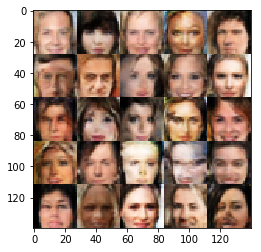

07/23/17 17:47:00  Epoch: 2/2  Step: 5960  Generator Loss: 0.59  Discriminator Loss: 1.16 
07/23/17 17:47:00  Epoch: 2/2  Step: 5970  Generator Loss: 0.94  Discriminator Loss: 0.72 
07/23/17 17:47:01  Epoch: 2/2  Step: 5980  Generator Loss: 0.98  Discriminator Loss: 0.75 
07/23/17 17:47:02  Epoch: 2/2  Step: 5990  Generator Loss: 0.94  Discriminator Loss: 1.00 
07/23/17 17:47:03  Epoch: 2/2  Step: 6000  Generator Loss: 0.32  Discriminator Loss: 1.56 


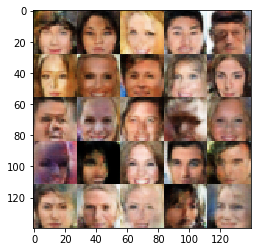

07/23/17 17:47:05  Epoch: 2/2  Step: 6010  Generator Loss: 0.90  Discriminator Loss: 0.73 
07/23/17 17:47:06  Epoch: 2/2  Step: 6020  Generator Loss: 1.36  Discriminator Loss: 0.79 
07/23/17 17:47:06  Epoch: 2/2  Step: 6030  Generator Loss: 1.45  Discriminator Loss: 0.44 
07/23/17 17:47:07  Epoch: 2/2  Step: 6040  Generator Loss: 1.64  Discriminator Loss: 0.81 
07/23/17 17:47:08  Epoch: 2/2  Step: 6050  Generator Loss: 0.50  Discriminator Loss: 1.22 


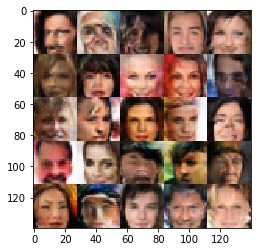

07/23/17 17:47:10  Epoch: 2/2  Step: 6060  Generator Loss: 1.26  Discriminator Loss: 0.57 
07/23/17 17:47:11  Epoch: 2/2  Step: 6070  Generator Loss: 2.02  Discriminator Loss: 0.82 
07/23/17 17:47:11  Epoch: 2/2  Step: 6080  Generator Loss: 2.03  Discriminator Loss: 0.97 
07/23/17 17:47:12  Epoch: 2/2  Step: 6090  Generator Loss: 1.92  Discriminator Loss: 0.38 
07/23/17 17:47:13  Epoch: 2/2  Step: 6100  Generator Loss: 0.66  Discriminator Loss: 1.02 


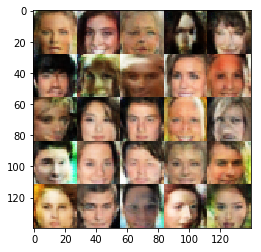

07/23/17 17:47:15  Epoch: 2/2  Step: 6110  Generator Loss: 1.00  Discriminator Loss: 0.82 
07/23/17 17:47:16  Epoch: 2/2  Step: 6120  Generator Loss: 2.54  Discriminator Loss: 1.00 
07/23/17 17:47:17  Epoch: 2/2  Step: 6130  Generator Loss: 0.79  Discriminator Loss: 0.98 
07/23/17 17:47:17  Epoch: 2/2  Step: 6140  Generator Loss: 1.63  Discriminator Loss: 0.89 
07/23/17 17:47:18  Epoch: 2/2  Step: 6150  Generator Loss: 1.27  Discriminator Loss: 0.59 


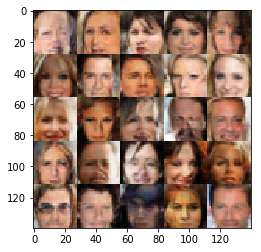

07/23/17 17:47:20  Epoch: 2/2  Step: 6160  Generator Loss: 1.33  Discriminator Loss: 0.75 
07/23/17 17:47:21  Epoch: 2/2  Step: 6170  Generator Loss: 0.20  Discriminator Loss: 1.98 
07/23/17 17:47:22  Epoch: 2/2  Step: 6180  Generator Loss: 1.62  Discriminator Loss: 0.76 
07/23/17 17:47:22  Epoch: 2/2  Step: 6190  Generator Loss: 0.79  Discriminator Loss: 0.89 
07/23/17 17:47:23  Epoch: 2/2  Step: 6200  Generator Loss: 1.03  Discriminator Loss: 1.01 


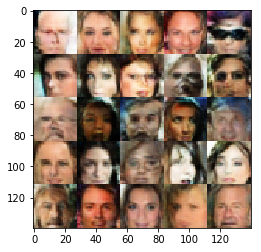

07/23/17 17:47:25  Epoch: 2/2  Step: 6210  Generator Loss: 0.25  Discriminator Loss: 1.92 
07/23/17 17:47:26  Epoch: 2/2  Step: 6220  Generator Loss: 0.78  Discriminator Loss: 0.98 
07/23/17 17:47:27  Epoch: 2/2  Step: 6230  Generator Loss: 0.38  Discriminator Loss: 1.43 
07/23/17 17:47:28  Epoch: 2/2  Step: 6240  Generator Loss: 0.88  Discriminator Loss: 0.82 
07/23/17 17:47:28  Epoch: 2/2  Step: 6250  Generator Loss: 2.63  Discriminator Loss: 0.62 


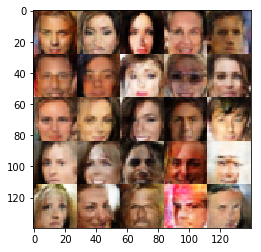

07/23/17 17:47:30  Epoch: 2/2  Step: 6260  Generator Loss: 1.71  Discriminator Loss: 0.49 
07/23/17 17:47:31  Epoch: 2/2  Step: 6270  Generator Loss: 3.23  Discriminator Loss: 0.85 
07/23/17 17:47:32  Epoch: 2/2  Step: 6280  Generator Loss: 0.76  Discriminator Loss: 0.91 
07/23/17 17:47:33  Epoch: 2/2  Step: 6290  Generator Loss: 0.25  Discriminator Loss: 1.90 
07/23/17 17:47:34  Epoch: 2/2  Step: 6300  Generator Loss: 0.58  Discriminator Loss: 1.08 


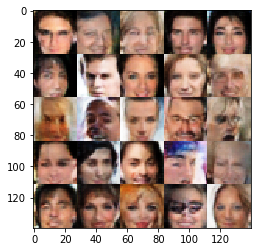

07/23/17 17:47:35  Epoch: 2/2  Step: 6310  Generator Loss: 1.75  Discriminator Loss: 0.55 
07/23/17 17:47:36  Epoch: 2/2  Step: 6320  Generator Loss: 1.65  Discriminator Loss: 0.58 
07/23/17 17:47:37  Epoch: 2/2  Step: 6330  Generator Loss: 0.60  Discriminator Loss: 1.08 


In [13]:
batch_size = 64
z_dim = 100
learning_rate = 0.0003
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.